In [ ]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import ast
from collections import defaultdict
import re
from datetime import datetime
import time
from tqdm import tqdm
from collections import defaultdict, Counter
import numpy as np



# Machine Learning
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor
from sklearn.svm import SVR, SVC
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report, confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.cluster import KMeans

# NLP
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import spacy
from textblob import TextBlob
from textblob import TextBlob



# Deep Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Time Series
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

import warnings
warnings.filterwarnings("ignore")

nltk.download("stopwords")
nltk.download("wordnet")
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
from google.colab import userdata
rapid_api_key = userdata.get("RAPID_API_KEY")

In [ ]:
import requests

In [ ]:
tiktok_creative_center_api_headers = {
    "X-RapidAPI-Key": rapid_api_key,
    "X-RapidAPI-Host": "tiktok-creative-center-api.p.rapidapi.com"
}

In [ ]:
countries = ["FR", "KR", "US", "CN", "MY"]

In [ ]:
countries = ["FR", "KR", "US", "CN", "MY"]

def fetch_trending_creators(page, limit, sort_by, country, audience_count, audience_country):
    url = "https://tiktok-creative-center-api.p.rapidapi.com/api/trending/creator"
    querystring = {
        "page": str(page),
        "limit": str(limit),
        "sort_by": sort_by,
        "country": country,
        "audience_count": str(audience_count),
        "audience_country": audience_country
    }

    response = requests.get(url, headers=tiktok_creative_center_api_headers, params=querystring)
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error {response.status_code}: {response.text}")
        return None

# Loop through countries and store results
all_creators = {}

for country in countries:
    print(f"\nFetching trending creators for {country}...")
    raw_trending_creators = fetch_trending_creators(
        page=1,
        limit=40,
        sort_by="follower",  # options: follower, engagement, avg_views
        country=country,
        audience_count=1,    # 1: 10k-100k followers
        audience_country=""  # keep empty to include all audience countries
    )
    all_creators[country] = raw_trending_creators

# Example: print creators for France
print(all_creators["FR"])



Fetching trending creators for FR...

Fetching trending creators for KR...

Fetching trending creators for US...

Fetching trending creators for CN...

Fetching trending creators for MY...
{'code': 0, 'msg': 'OK', 'request_id': '20250911124452CCB4CA8275ACB1645392', 'data': {'creators': [{'tcm_id': '7442088405585887288', 'user_id': '6738584472310744069', 'nick_name': 'Lucas Guedez', 'avatar_url': 'https://p77-sign-va.tiktokcdn.com/tos-maliva-avt-0068/926df6a9c7b954cd88087d2d0929c020~tplv-tiktokx-cropcenter:100:100.png?dr=14579&refresh_token=98f909b6&x-expires=1757736000&x-signature=oG4rBfaaqEznCE0IX4UMDOitGbs%3D&t=4d5b0474&ps=13740610&shp=a5d48078&shcp=317596d8&idc=my', 'country_code': 'FR', 'follower_cnt': 6019840, 'liked_cnt': 159704701, 'tt_link': 'https://www.tiktok.com/@lucasguedez', 'tcm_link': 'https://creatormarketplace.tiktok.com/ad#/author/7442088405585887288', 'items': [{'item_id': '7463129571668331782', 'cover_url': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-p-0068/ocfzS

In [ ]:
def parse_trending_creators(raw_trending_creators):
    creators = []

    for creator in raw_trending_creators.get("data", {}).get("creators", []):
      try:

        creator_data = {
            "user_id": creator.get("user_id", ""),
            "nick_name": creator.get("nick_name", ""),
            "avatar_url": creator.get("avatar_url", ""),
            "country_code": creator.get("country_code", ""),
            "follower_cnt": creator.get("follower_cnt", None),
            "liked_cnt": creator.get("liked_cnt", None),
            "tt_link": creator.get("tt_link", ""),
            "tcm_link": creator.get("tcm_link", ""), # tiktok creator market
        }

        creators.append(creator_data)
      except Exception as e:
          print(f"Error parsing post: {e}")
    return creators

all_parsed_creators = {}

for country, raw_data in all_creators.items():
    parsed = parse_trending_creators(raw_data)
    all_parsed_creators[country] = parsed

all_parsed_creators

{'FR': [{'user_id': '6738584472310744069',
   'nick_name': 'Lucas Guedez',
   'avatar_url': 'https://p77-sign-va.tiktokcdn.com/tos-maliva-avt-0068/926df6a9c7b954cd88087d2d0929c020~tplv-tiktokx-cropcenter:100:100.png?dr=14579&refresh_token=98f909b6&x-expires=1757736000&x-signature=oG4rBfaaqEznCE0IX4UMDOitGbs%3D&t=4d5b0474&ps=13740610&shp=a5d48078&shcp=317596d8&idc=my',
   'country_code': 'FR',
   'follower_cnt': 6019840,
   'liked_cnt': 159704701,
   'tt_link': 'https://www.tiktok.com/@lucasguedez',
   'tcm_link': 'https://creatormarketplace.tiktok.com/ad#/author/7442088405585887288'},
  {'user_id': '6638841651668877317',
   'nick_name': 'Diana Bouli',
   'avatar_url': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-avt-0068/0a1309c7ae7211f90cbfc1cba4f24d76~tplv-tiktokx-cropcenter:100:100.png?dr=14579&refresh_token=a308ac66&x-expires=1757736000&x-signature=A6kkD8EyDKw%2BxLP5AZvcPY0UGM4%3D&t=4d5b0474&ps=13740610&shp=a5d48078&shcp=317596d8&idc=my',
   'country_code': 'FR',
   'follower_cnt'

In [ ]:
import pandas as pd

all_rows = []

for country, creators in all_parsed_creators.items():
    for creator in creators:
        creator["country"] = country
        all_rows.append(creator)

trending_creators_df = pd.DataFrame(all_rows)

trending_creators_df

,user_id,nick_name,avatar_url,country_code,follower_cnt,liked_cnt,tt_link,tcm_link,country
0,6738584472310744069,Lucas Guedez,https://p77-sign-va.tiktokcdn.com/tos-maliva-a...,FR,6019840,159704701,https://www.tiktok.com/@lucasguedez,https://creatormarketplace.tiktok.com/ad#/auth...,FR
1,6638841651668877317,Diana Bouli,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,FR,3609137,121795473,https://www.tiktok.com/@diana_bouli,https://creatormarketplace.tiktok.com/ad#/auth...,FR
2,6844211424883393541,Tonton Pal,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,FR,1436000,51838625,https://www.tiktok.com/@tonton_pal,https://creatormarketplace.tiktok.com/ad#/auth...,FR
3,6692208234629088261,Andy Enriquez,https://p77-sign-va.tiktokcdn.com/tos-maliva-a...,FR,887474,20054602,https://www.tiktok.com/@andy..enriquez,https://creatormarketplace.tiktok.com/ad#/auth...,FR
4,6804903927885595654,Sarah Schollmeier,https://p16-sign-sg.tiktokcdn.com/tos-alisg-av...,FR,653827,78385696,https://www.tiktok.com/@metodoquestiona,https://creatormarketplace.tiktok.com/ad#/auth...,FR
...,...,...,...,...,...,...,...,...,...
155,6829903268815717378,نظام,https://p16-sign-sg.tiktokcdn.com/tos-alisg-av...,MY,363858,105643902,https://www.tiktok.com/@soulzangs,https://creatormarketplace.tiktok.com/ad#/auth...,MY
156,6552873986865840129,Dee Meow,https://p16-sign-va.tiktokcdn.com/musically-ma...,MY,355047,1452765,https://www.tiktok.com/@deedee93.22,https://creatormarketplace.tiktok.com/ad#/auth...,MY
157,6996846485615739930,👑 ပုသိမ်သူ 👑,https://p16-sign-sg.tiktokcdn.com/tos-alisg-av...,MY,350015,5357320,https://www.tiktok.com/@su_myat_oo,https://creatormarketplace.tiktok.com/ad#/auth...,MY
158,6654356735526666242,VAARICH,https://p19-common-sign-useastred.tiktokcdn-eu...,MY,336735,15116645,https://www.tiktok.com/@vaarich,https://creatormarketplace.tiktok.com/ad#/auth...,MY


In [ ]:
trending_creators_df.to_csv('trending_creators.csv', index=False)


In [ ]:
def fetch_trending_songs(page, limit, period, rank_type, country):
    url = "https://tiktok-creative-center-api.p.rapidapi.com/api/trending/song"
    querystring = {"page":str(page),"limit":str(limit),"period":str(period),"rank_type":rank_type,"country":country}

    response = requests.get(url, headers=tiktok_creative_center_api_headers, params=querystring)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error {response.status_code}: {response.text}")
        return None

#user input
page = 1
limit = 20
period = 120 #values: "7", "30", "120"
rank_type = "popular" #values: "popular" or "surging"
country = ""

raw_trending_songs = fetch_trending_songs(page, limit, period, rank_type, country)
print(raw_trending_songs)

{'code': 0, 'msg': 'OK', 'request_id': '20250905164030C3A1F9A3B7ABF9B7C1B1', 'data': {'pagination': {'page': 1, 'size': 20, 'total': 100, 'has_more': True}, 'sound_list': [{'author': 'BunnaB', 'clip_id': '7492171577455593473', 'country_code': 'US', 'cover': 'https://p16-sg.tiktokcdn.com/aweme/720x720/tos-alisg-v-2774/okKnBB7nNoAYwiE0CQivAAwhzvKAeqELsABwWd.jpeg', 'duration': 60, 'if_cml': False, 'is_search': False, 'link': 'https://www.tiktok.com/music/x-7492171577455593473', 'on_list_times': None, 'promoted': False, 'rank': 1, 'rank_diff': 0, 'rank_diff_type': 2, 'related_items': [{'item_id': 7502540069014752000, 'cover_uri': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-p-0068c799-us/oAIICIGuLLudPYe5PjvqACjIHOdIQqFeAQMfqI~tplv-noop.image?t=9276707c&x-expires=1757083296&x-signature=VvKQ%2F3dexWYLshOVX0Hg2G7ufo4%3D'}, {'item_id': 7522678958387662000, 'cover_uri': 'https://p16-sign-va.tiktokcdn.com/tos-maliva-p-0068c799-us/oIrwI4UJGiGb7QlUUXaDP8MsxGECBi6ILrgBA~tplv-noop.image?t=9276707c&

In [ ]:
def parse_trending_songs(raw_trending_songs):
    songs = []

    for song in raw_trending_songs.get("data", {}).get("sound_list", []):
      try:
        # Parse trend (dictionary)
        trend = []
        for t in song.get("trend", []):
            time = t.get("time")
            value = t.get("value")
            trend.append({"date": time, "value": value})

        song_data = {
            "author": song.get("author", ""),
            "clipID": song.get("clip_id", ""),
            "country_code": song.get("country_code", ""),
            "duration": song.get("duration", ""),
            "link": song.get("link", ""),
            "promoted": song.get("promoted", False),
            "rank": song.get("rank", None),
            "songID": song.get("song_id", ""),
            "title": song.get("title", ""),
            "trend": trend,
            "urlTitle": song.get("url_title", ""),
        }

        songs.append(song_data)
      except Exception as e:
          print(f"Error parsing post: {e}")
    return songs

parsed_trending_songs = parse_trending_songs(raw_trending_songs)
parsed_trending_songs

[{'author': 'BunnaB',
  'clipID': '7492171577455593473',
  'country_code': 'US',
  'duration': 60,
  'link': 'https://www.tiktok.com/music/x-7492171577455593473',
  'promoted': False,
  'rank': 1,
  'songID': '7492170448249899009',
  'title': 'Bunna Summa',
  'trend': [{'date': 1748044800, 'value': 0.78},
   {'date': 1748649600, 'value': 1},
   {'date': 1749254400, 'value': 0.89},
   {'date': 1749859200, 'value': 0.74},
   {'date': 1750464000, 'value': 0.48},
   {'date': 1751068800, 'value': 0.41},
   {'date': 1751673600, 'value': 0.31},
   {'date': 1752278400, 'value': 0.31},
   {'date': 1752883200, 'value': 0.22},
   {'date': 1753488000, 'value': 0.14},
   {'date': 1754092800, 'value': 0.09},
   {'date': 1754697600, 'value': 0.06},
   {'date': 1755302400, 'value': 0.04},
   {'date': 1755907200, 'value': 0.04},
   {'date': 1756512000, 'value': 0.03}],
  'urlTitle': 'Bunna-Summa'},
 {'author': 'Sok Baraby',
  'clipID': '7446723477296515088',
  'country_code': 'US',
  'duration': 60,
  

In [ ]:
trending_songs_df = pd.DataFrame(parsed_trending_songs)
trending_songs_df

,author,clipID,country_code,duration,link,promoted,rank,songID,title,trend,urlTitle
0,BunnaB,7492171577455593473,US,60,https://www.tiktok.com/music/x-749217157745559...,False,1,7492170448249899009,Bunna Summa,"[{'date': 1748044800, 'value': 0.78}, {'date':...",Bunna-Summa
1,Sok Baraby,7446723477296515088,US,60,https://www.tiktok.com/music/x-744672347729651...,False,2,7446724137378416641,NO AUDIO,"[{'date': 1748044800, 'value': 0}, {'date': 17...",NO-AUDIO
2,Tollan Kim,7072513628145977346,US,60,https://www.tiktok.com/music/x-707251362814597...,False,3,7072513627990804481,Aesthetic,"[{'date': 1748044800, 'value': 1}, {'date': 17...",Aesthetic
3,Jorjiana,7502098545378429742,US,25,https://www.tiktok.com/music/x-750209854537842...,False,4,7503634006380267536,Shark (feat. Rio Da Yung Og),"[{'date': 1749254400, 'value': 0.4}, {'date': ...",Shark-feat-Rio-Da-Yung-Og
4,MOLIY & Skillibeng & Shenseea,7468711641658525713,US,60,https://www.tiktok.com/music/x-746871164165852...,False,5,7468715280215148545,Shake It To The Max (FLY) (Remix),"[{'date': 1748044800, 'value': 0.38}, {'date':...",Shake-It-To-The-Max-FLY-Remix
5,PinkPantheress,7502057134566525713,US,13,https://www.tiktok.com/music/x-750205713456652...,False,6,7499501701586651153,Illegal,"[{'date': 1748044800, 'value': 0}, {'date': 17...",Illegal
6,CYRIL & MOONLGHT & The La's,7424014547218565904,US,22,https://www.tiktok.com/music/x-742401454721856...,False,7,7503950818010335233,There She Goes,"[{'date': 1748044800, 'value': 0.03}, {'date':...",There-She-Goes
7,Lyrebirds music,6974451099088455681,US,215,https://www.tiktok.com/music/x-697445109908845...,False,8,6974451099000375297,Classic classical gymnopedie solo piano(1034554),"[{'date': 1748044800, 'value': 0.47}, {'date':...",Classic-classical-gymnopedie-solo-piano-1034554
8,AntonioVivald,7498488534715336720,US,60,https://www.tiktok.com/music/x-749848853471533...,False,9,7498494199643310081,Almost forgot that this was the whole point - ...,"[{'date': 1748044800, 'value': 0}, {'date': 17...",Almost-forgot-that-this-was-the-whole-point-Ta...
9,ivri,7509620229598971905,US,15,https://www.tiktok.com/music/x-750962022959897...,False,10,7509619317970552833,tower of memories,"[{'date': 1749859200, 'value': 0}, {'date': 17...",tower-of-memories


In [ ]:
trending_songs_df.to_csv("trending_songs.csv", index=False)
# trending_songs_df = pd.read_csv("trending_songs.csv")
# trending_songs_df

In [ ]:
def fetch_trending_keywords(page, limit, period, country, order_by, industry, objective, keyword_type):
    url = "https://tiktok-creative-center-api.p.rapidapi.com/api/trending/keyword"
    querystring = {"page":str(page),"limit":str(limit),"period":str(period),"country":country, "industry":industry, "objective":objective, "keyword_type":keyword_type}

    response = requests.get(url, headers=tiktok_creative_center_api_headers, params=querystring)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error {response.status_code}: {response.text}")
        return None
keywords={}
for country in countries:
#user input
  page = 1
  limit =50
  period = 30 #values: "7", "30", "120"
  rank_type = "popular" #values: "popular" or "surging"
  country = country
  order_by = "" # allowed values not specified in documentation
  industry = "14000000000,26114000000,23122000000" # allowed values refer here: https://gist.githubusercontent.com/apiboxguru/d36908ea2bbe307e81bcc09ccf59616b/raw/302b5a442df9a6efced1dc430fd64d10a8226aeb/tiktok-ads-industry-code.json
  objective = ""
  # Enum: 1: Traffic | 2: App Installs | 3: Conversions | 4: Video Views | 5: Reach | 8: Lead Generation | 14: Product Sales
  # You can combine multiple objectives by using a comma. For example: 1,2
  keyword_type = ""
  # Enum: 1: Selling points | 2: Pain points | 3: Target audience | 4: Call-to-action | 5: Other | 6: Products
  # You can combine multiple types by using a comma. For example: 1,2

  raw_trending_keywords = fetch_trending_keywords(page, limit, period, country, order_by, industry, objective, keyword_type)
  keywords[country] = raw_trending_keywords

print(keywords)

{'FR': {'code': 0, 'msg': 'OK', 'request_id': '20250912165810DA9408CBF5F6EA997226', 'data': {'keyword_list': [{'comment': 127, 'cost': 11500, 'cpa': 0.27, 'ctr': 0.51, 'cvr': 100, 'impression': 9930000, 'keyword': 'free', 'like': 13135, 'play_six_rate': 8.72, 'post': 3090, 'post_change': 81.07, 'share': 177, 'video_list': ['7488201687124004103', '7527527707492617473', '7546907750748474632', '7457151524582608144', '7530572377009229064']}, {'comment': 443, 'cost': 51100, 'cpa': 0.19, 'ctr': 0.5, 'cvr': 100, 'impression': 24300000, 'keyword': 'for free', 'like': 35938, 'play_six_rate': 9.08, 'post': 2440, 'post_change': 80.49, 'share': 250, 'video_list': ['7545456812682710280', '7524271653908516109', '7505060271765966088', '7533475938244316429', '7451262179476589840']}, {'comment': 120, 'cost': 4780, 'cpa': 23.1, 'ctr': 0.93, 'cvr': 2.06, 'impression': 2430000, 'keyword': '50% off', 'like': 10317, 'play_six_rate': 6.78, 'post': 2110, 'post_change': 163.66, 'share': 107, 'video_list': ['75

In [ ]:
print(keywords)

{'FR': {'code': 0, 'msg': 'OK', 'request_id': '20250912165810DA9408CBF5F6EA997226', 'data': {'keyword_list': [{'comment': 127, 'cost': 11500, 'cpa': 0.27, 'ctr': 0.51, 'cvr': 100, 'impression': 9930000, 'keyword': 'free', 'like': 13135, 'play_six_rate': 8.72, 'post': 3090, 'post_change': 81.07, 'share': 177, 'video_list': ['7488201687124004103', '7527527707492617473', '7546907750748474632', '7457151524582608144', '7530572377009229064']}, {'comment': 443, 'cost': 51100, 'cpa': 0.19, 'ctr': 0.5, 'cvr': 100, 'impression': 24300000, 'keyword': 'for free', 'like': 35938, 'play_six_rate': 9.08, 'post': 2440, 'post_change': 80.49, 'share': 250, 'video_list': ['7545456812682710280', '7524271653908516109', '7505060271765966088', '7533475938244316429', '7451262179476589840']}, {'comment': 120, 'cost': 4780, 'cpa': 23.1, 'ctr': 0.93, 'cvr': 2.06, 'impression': 2430000, 'keyword': '50% off', 'like': 10317, 'play_six_rate': 6.78, 'post': 2110, 'post_change': 163.66, 'share': 107, 'video_list': ['75

In [ ]:
def parse_trending_keywords(raw_trending_keywords):
    keywords = []

    for keyword in raw_trending_keywords.get("data", {}).get("keyword_list", []):
      try:

        keyword_data = {
            "comment": keyword.get("comment", None),
            "cost": keyword.get("cost", None), # Total cost (likely in cents or ad units) spent on promoting content with this keyword
            "cpa": keyword.get("cpa", None), # Cost Per Action (e.g., per click, signup, conversion).
            "ctr": keyword.get("ctr", None), # Click-Through Rate
            "cvr": keyword.get("cvr", None), # Conversion Rate
            "impression": keyword.get("impression", None),
            "keyword": keyword.get("keyword", ""),
            "like": keyword.get("like", None),
            "play_six_rate": keyword.get("play_six_rate", None), # "6-second play rate" — the percentage of people who watched at least 6 seconds of a video after it started playing
            "post_change": keyword.get("post_change", None),  # "Change in number of posts" — an increase or decrease in content volume using that keyword
            "share": keyword.get("share", None),
            "video_list": keyword.get("video_list", {}),
        }

        keywords.append(keyword_data)
      except Exception as e:
          print(f"Error parsing post: {e}")
    return keywords

all_keywords={}

for country, raw_data in keywords.items():
    parsed_keywords = parse_trending_keywords(raw_data)
    all_keywords[country] = parsed_keywords
    print(f"{country}: {len(parsed_keywords)} keywords parsed")

all_keywords

FR: 50 keywords parsed
KR: 50 keywords parsed
US: 50 keywords parsed


TypeError: 'NoneType' object is not iterable

In [ ]:
trending_keywords_df = pd.DataFrame(parsed_trending_keywords)
trending_keywords_df

,comment,cost,cpa,ctr,cvr,impression,keyword,like,play_six_rate,post_change,share,video_list
0,1274,228000,16.40,1.20,7.76,32100000,free shipping,113926,7.73,78.76,1330,"[7425681746982718737, 7443977902942719233, 754..."
1,860,200000,9.05,0.78,16.35,37800000,summer,58655,5.54,65.27,676,"[7532643052872158471, 7516570469210852616, 750..."
2,194,51100,16.70,0.92,7.03,10500000,shoe,23423,5.08,73.64,271,"[7538873437767355703, 7530621649758997778, 753..."
3,173,44200,21.30,1.01,5.30,8600000,shoes,21788,5.33,72.04,239,"[7538873437767355703, 7538885722401508622, 753..."
4,482,73400,26.40,0.85,4.85,15300000,men,12289,4.48,77.66,798,"[7516665321319664913, 7483178914186104065, 748..."
5,195,17600,13.80,1.93,6.30,2440000,shirt,9494,10.15,65.58,343,"[7525371418964479262, 7514164075828415787, 752..."
6,2474,264000,0.54,1.13,100.00,40000000,for free,127736,11.47,83.22,1196,"[7543125147247463696, 7545393118615440647, 754..."
7,489,118000,3.92,1.18,32.56,16700000,shop now,39071,7.95,85.63,938,"[7499889876628802817, 7543307850970303799, 747..."
8,183,38900,6.51,1.81,13.77,4910000,dress,25874,9.84,72.17,315,"[7540026329182391607, 7522206549033372983, 752..."
9,260,39700,16.20,2.30,6.58,3630000,bra,10840,13.82,79.92,302,"[7525605763641904397, 7499889876628802817, 753..."


In [ ]:
trending_keywords_df.to_csv("trending_keywords.csv", index=False)

In [ ]:
# trending_keywords_df = pd.read_csv("trending_keywords.csv")
# trending_keywords_df

In [ ]:
countries = ["FR", "KR", "US", "CN", "MY"]
def fetch_trending_hashtags(page, limit, period, country, sort_by, filter_by, industry_id):
    url = "https://tiktok-creative-center-api.p.rapidapi.com/api/trending/hashtag"
    querystring = {"page":str(page),"limit":str(limit),"period":str(period),"country":country, "sort_by":sort_by, "filter_by":filter_by, "industry_id":industry_id}

    response = requests.get(url, headers=tiktok_creative_center_api_headers, params=querystring)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error {response.status_code}: {response.text}")
        return None
hashtags={}
for country in countries:
#user input
  page = 1
  limit = 60
  period = 30 #values: "7", "30", "120"
  country = country
  sort_by = "popular"
  filter_by = "" # new_on_board: new to top 100
  industry_id = "14000000000" # allowed values refer here: https://gist.githubusercontent.com/apiboxguru/51b98823b3c305b18a542a41d9ab3dca/raw/c5ea0bb6dcb58d71b2b0ca613c842da410cead51/tiktok-ads-industry-no-sub-code.json

  raw_trending_hashtags = fetch_trending_hashtags(page, limit, period, country, sort_by, filter_by, industry_id)
  hashtags[country] = raw_trending_hashtags
print(hashtags)

{'FR': {'code': 0, 'msg': 'OK', 'request_id': '20250912163230A59487E0A5B61B9B3D16', 'data': {'list': [{'hashtag_id': '88007974', 'hashtag_name': 'demaquillant', 'country_info': {'id': 'FR', 'value': 'France', 'label': 'FR'}, 'industry_info': {'id': 14000000000, 'value': 'Beauty & Personal Care', 'label': 'label_14000000000'}, 'is_promoted': False, 'trend': [{'time': 1755043200, 'value': 1}, {'time': 1755129600, 'value': 0.84}, {'time': 1755216000, 'value': 0.85}, {'time': 1755302400, 'value': 0.79}, {'time': 1755388800, 'value': 0.81}, {'time': 1755475200, 'value': 0.79}, {'time': 1755561600, 'value': 0.77}, {'time': 1755648000, 'value': 0.77}, {'time': 1755734400, 'value': 0.75}, {'time': 1755820800, 'value': 0.62}, {'time': 1755907200, 'value': 0.53}, {'time': 1755993600, 'value': 0.48}, {'time': 1756080000, 'value': 0.4}, {'time': 1756166400, 'value': 0.39}, {'time': 1756252800, 'value': 0.45}, {'time': 1756339200, 'value': 0.46}, {'time': 1756425600, 'value': 0.43}, {'time': 175651

In [ ]:
def parse_trending_hashtags(raw_trending_hashtags):
    hashtags = []

    for hashtag in raw_trending_hashtags.get("data", {}).get("list", []):
      try:
        # Parse trend (dictionary)
        trend = []
        for h in hashtag.get("trend", []):
            time = h.get("time", None)
            value = h.get("value", None)
            trend.append({"date": time, "value": value})

        # Parse creators (dictionary)
        creators = []
        for c in hashtag.get("creators", []):
            nickName = c.get("nick_name", "")
            avatarUrl = c.get("avatar_url", "")
            creators.append({"nick_name": nickName, "avatar_url": avatarUrl})

        hashtag_data = {
            "hashtag_id": hashtag.get("hashtag_id", ""),
            "hashtag_name": hashtag.get("hashtag_name", ""),
            "country_info": {
                "id": hashtag.get("country_info", {}).get("id", ""),
                "value": hashtag.get("country_info", {}).get("value", ""),
                "label": hashtag.get("country_info", {}).get("label", ""),
            },
            "industry_info": {
                "id": hashtag.get("industry_info", {}).get("id", ""),
                "value": hashtag.get("industry_info", {}).get("value", ""),
                "label": hashtag.get("industry_info", {}).get("label", ""),
            },
            "trend": trend,
            "creators": creators,
            "publish_cnt": hashtag.get("publish_cnt", None),    #posts published using the hashtag
            "video_views": hashtag.get("video_views", None),
            "rank": hashtag.get("rank", None),   #lower=more trending
            "rank_diff": hashtag.get("rank_diff", None),      #Change in rank from a previous period
            "rank_diff_type": hashtag.get("rank_diff_type", None),
        }
        hashtags.append(hashtag_data)
      except Exception as e:
          print(f"Error parsing post: {e}")
    return hashtags

all_hashtags={}
for country, raw_data in hashtags.items():
  parsed_trending_hashtags = parse_trending_hashtags(raw_data)
  all_hashtags[country] = parsed_trending_hashtags
all_hashtags


{'FR': [{'hashtag_id': '88007974',
   'hashtag_name': 'demaquillant',
   'country_info': {'id': 'FR', 'value': 'France', 'label': 'FR'},
   'industry_info': {'id': 14000000000,
    'value': 'Beauty & Personal Care',
    'label': 'label_14000000000'},
   'trend': [{'date': 1755043200, 'value': 1},
    {'date': 1755129600, 'value': 0.84},
    {'date': 1755216000, 'value': 0.85},
    {'date': 1755302400, 'value': 0.79},
    {'date': 1755388800, 'value': 0.81},
    {'date': 1755475200, 'value': 0.79},
    {'date': 1755561600, 'value': 0.77},
    {'date': 1755648000, 'value': 0.77},
    {'date': 1755734400, 'value': 0.75},
    {'date': 1755820800, 'value': 0.62},
    {'date': 1755907200, 'value': 0.53},
    {'date': 1755993600, 'value': 0.48},
    {'date': 1756080000, 'value': 0.4},
    {'date': 1756166400, 'value': 0.39},
    {'date': 1756252800, 'value': 0.45},
    {'date': 1756339200, 'value': 0.46},
    {'date': 1756425600, 'value': 0.43},
    {'date': 1756512000, 'value': 0.37},
    {'

In [ ]:
all_parsed_trending_hashtags = []

for country, hashtags in all_hashtags.items():
    for hashtag in hashtags:
        hashtag["country"] = country
        all_parsed_trending_hashtags.append(hashtag)

trending_hashtags_df = pd.DataFrame(all_parsed_trending_hashtags)
trending_hashtags_df

,hashtag_id,hashtag_name,country_info,industry_info,trend,creators,publish_cnt,video_views,rank,rank_diff,rank_diff_type,country
0,88007974,demaquillant,"{'id': 'FR', 'value': 'France', 'label': 'FR'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 1}, {'date': 17...",[],1652,16341047,1,2.0,1,FR
1,5592363,coiffeuse,"{'id': 'FR', 'value': 'France', 'label': 'FR'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.9}, {'date': ...",[],2625,27899667,2,3.0,1,FR
2,5403,hygiene,"{'id': 'FR', 'value': 'France', 'label': 'FR'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.89}, {'date':...",[],1341,61375145,3,3.0,1,FR
3,69411,brushing,"{'id': 'FR', 'value': 'France', 'label': 'FR'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.64}, {'date':...",[],1075,30580794,4,3.0,1,FR
4,20509534,antiage,"{'id': 'FR', 'value': 'France', 'label': 'FR'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.62}, {'date':...",[],1252,20885564,5,3.0,1,FR
...,...,...,...,...,...,...,...,...,...,...,...,...
235,144167,lipstain,"{'id': 'MY', 'value': 'Malaysia', 'label': 'MY'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.73}, {'date':...",[],2569,9339831,56,0.0,2,MY
236,7126078914543222810,blancofragrance,"{'id': 'MY', 'value': 'Malaysia', 'label': 'MY'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.71}, {'date':...",[],2184,24827469,57,2.0,1,MY
237,7349172437969436674,qiveapapayascrub,"{'id': 'MY', 'value': 'Malaysia', 'label': 'MY'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.71}, {'date':...",[],2457,10212886,58,3.0,1,MY
238,1666965543795713,parfumviral,"{'id': 'MY', 'value': 'Malaysia', 'label': 'MY'}","{'id': 14000000000, 'value': 'Beauty & Persona...","[{'date': 1755043200, 'value': 0.88}, {'date':...","[{'nick_name': 'Mommy baby raffa🎀🍭', 'avatar_u...",1913,18574544,59,1.0,1,MY


In [ ]:
trending_hashtags_df.to_csv("trending_hashtags.csv", index=False)
# trending_hashtags_df = pd.read_csv("trending_hashtags.csv")
# trending_hashtags_df

In [ ]:
def fetch_trending_videos(page, limit, period, order_by, country):
    url = "https://tiktok-creative-center-api.p.rapidapi.com/api/trending/video"
    querystring = {
        "page": str(page),
        "limit": str(limit),
        "period": str(period),
        "order_by": order_by,
        "country": country
    }

    response = requests.get(url, headers=tiktok_creative_center_api_headers, params=querystring)

    if response.status_code == 200:
        return response.json()
    else:
        print(f"Error {response.status_code} for {country}: {response.text}")
        return None


def parse_trending_videos(raw_data, country):
    videos = []
    for video in raw_data.get("data", {}).get("videos", []):
        try:
            video_data = {
                "country": country,
                "country_code": video.get("country_code", ""),
                "cover": video.get("cover", ""),
                "duration": video.get("duration", ""),
                "id": video.get("id", ""),
                "item_id": video.get("item_id", ""),
                "item_url": video.get("item_url", ""),
                "region": video.get("region", ""),
                "title": video.get("title", "")
            }
            videos.append(video_data)
        except Exception as e:
            print(f"Error parsing post for {country}: {e}")
    return videos


# User input
limit = 20
total_videos_needed = 100   # per country
total_pages = total_videos_needed // limit
period = 30   # values: 7 or 30
order_by = "vv"

# list of country codes to loop through
countries = ["FR", "KR", "US", "CN", "MY"]

all_videos = []

for country in countries:
    print(f"Fetching videos for {country}...")
    for page in range(1, total_pages + 1):
        raw_trending_videos = fetch_trending_videos(page, limit, period, order_by, country)
        if raw_trending_videos:
            all_videos.extend(parse_trending_videos(raw_trending_videos, country))

print(f"Total videos fetched across all countries: {len(all_videos)}")





Fetching videos for FR...
Fetching videos for KR...
Fetching videos for US...
Fetching videos for CN...
Fetching videos for MY...
Total videos fetched across all countries: 395


NameError: name 'csv' is not defined

In [ ]:
trending_videos_df = pd.DataFrame(all_videos)
trending_videos_df

,country,country_code,cover,duration,id,item_id,item_url,region,title
0,FR,FR,https://p16-sign-va.tiktokcdn.com/tos-maliva-p...,19,7536961792963120390,7536961792963120390,https://www.tiktok.com/@mnm_pipi/video/7536961...,France,"Plus d'achats, moins de dépenses"
1,FR,FR,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,56,7195145145036082433,7195145145036082433,https://www.tiktok.com/@mnm_pipi/video/7195145...,France,Accordez une pause à votre pouce 👍
2,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,40,7539831870050127126,7539831870050127126,https://www.tiktok.com/@mnm_pipi/video/7539831...,France,"KATY PERRY X MILKA MMMAX🦋 3 tablettes, 3 unive..."
3,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,50,7533656516830776598,7533656516830776598,https://www.tiktok.com/@mnm_pipi/video/7533656...,France,On papote tranquille… et là ? Une mouche débar...
4,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,51,7539873053346417942,7539873053346417942,https://www.tiktok.com/@mnm_pipi/video/7539873...,France,La tournée de Katy Perry est complète ? 🤯 Pas ...
...,...,...,...,...,...,...,...,...,...
390,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,10,7540235017130265864,7540235017130265864,https://www.tiktok.com/@mnm_pipi/video/7540235...,Malaysia,✅165Hz Industry-Leading Refresh Rate ✅13.3 Inc...
391,MY,MY,https://p16-sign-va.tiktokcdn.com/tos-maliva-p...,30,7537218284995841336,7537218284995841336,https://www.tiktok.com/@mnm_pipi/video/7537218...,Malaysia,Premier League kembali! Saksikan semua 380 per...
392,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,23,7538649853484649746,7538649853484649746,https://www.tiktok.com/@mnm_pipi/video/7538649...,Malaysia,Gempar! Seorang pekerja tiba-tiba terjatuh dek...
393,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,18,7545778011749109000,7545778011749109000,https://www.tiktok.com/@mnm_pipi/video/7545778...,Malaysia,💖 𝗨𝗽 𝗧𝗼 𝟰𝟬% 𝗢𝗳𝗳 𝗼𝗻 𝗕𝗲𝗮𝘂𝘁𝘆 & 𝗪𝗲𝗹𝗹𝗻𝗲𝘀𝘀! | 𝟰 - 𝟴 ...


In [ ]:
trending_videos_df.to_csv("trending_videos.csv", index=False)


In [ ]:
tiktok89_api_headers = {
    "X-RapidAPI-Key": rapid_api_key,
    "X-RapidAPI-Host": "tiktok-scraper7.p.rapidapi.com",
}

In [ ]:
def fetch_video_details(video_url):
    url = "https://tiktok-scraper7.p.rapidapi.com/"
    querystring = {"url": video_url}
    response = requests.get(url, headers=tiktok89_api_headers, params=querystring)
    print("Status:", response.status_code)
    print("Raw Response:", response.text)

    if response.status_code == 200:
        json_data = response.json()
        try:
            data = json_data.get("data", {})
            author = data.get("author", {})
            music = data.get("music_info", {})

            return {
                "title": data.get("title", ""),
                "create_time": data.get("create_time", ""),
                "author_user_id": author.get("id", ""),
                "author_username": author.get("unique_id", ""),
                "author_nickname": author.get("nickname", ""),

                "music_author": music.get("author", ""),
                "music_title": music.get("title", ""),
                "music_duration": music.get("duration", None),
                "music_id": music.get("id", ""),

                "collect_count": data.get("collect_count", None),
                "comment_count": data.get("comment_count", None),
                "digg_count": data.get("digg_count", None),
                "play_count": data.get("play_count", None),
                "share_count": data.get("share_count", None),
            }
        except Exception as e:
            print(f"Unexpected format in response: {e}")
            return None
    else:
        print(f"Failed for video_id with error {response.status_code}")
        return None

test_video_url = "https://www.tiktok.com/@mnm_pipi/video/7389407147483778335"
fetch_video_details(test_video_url)

Status: 200
Raw Response: {"code":0,"msg":"success","processed_time":0.1992,"data":{"aweme_id":"v15044gf0000cq673gvog65unk2nedsg","id":"7389407147483778335","region":"US","title":"Getting in line as we speak","cover":"https:\/\/p16-pu-sign-useast8.tiktokcdn-us.com\/tos-useast8-p-0068-tx2\/oUEEMFmvHB2NEVDpIfOiMVBAELcQ5jeD3qHARr~tplv-tiktokx-cropcenter:300:400.jpeg?dr=14579&refresh_token=cde5049d&x-expires=1757754000&x-signature=PCcl9LGyRZvKm4Wpu0dxjqoPxZU%3D&t=4d5b0474&ps=13740610&shp=d05b14bd&shcp=34ff8df6&idc=maliva&s=AWEME_DETAIL","ai_dynamic_cover":"https:\/\/p16-pu-sign-useast8.tiktokcdn-us.com\/tos-useast8-p-0068-tx2\/5acac95902ba4dcab23701598c52b49b_1720480446~tplv-tiktokx-origin.image?dr=14575&refresh_token=742709b1&x-expires=1757754000&x-signature=ysLORfPykOW2pAqAAkEt%2BUUr7bE%3D&t=4d5b0474&ps=13740610&shp=d05b14bd&shcp=34ff8df6&idc=maliva&s=AWEME_DETAIL","origin_cover":"https:\/\/p16-pu-sign-useast8.tiktokcdn-us.com\/tos-useast8-p-0068-tx2\/4717b55bcde04c24a8d5086250697c53_172

{'title': 'Getting in line as we speak',
 'create_time': 1720480443,
 'author_user_id': '82316984880640000',
 'author_username': 'tacobell',
 'author_nickname': 'tacobell',
 'music_author': 'tacobell',
 'music_title': 'original sound - tacobell',
 'music_duration': 10,
 'music_id': '7389407199702960926',
 'collect_count': 15879,
 'comment_count': 2582,
 'digg_count': 135950,
 'play_count': 174703280,
 'share_count': 28043}

In [ ]:
detailed_videos = []

for video_url in trending_videos_df["item_url"]:
    details = fetch_video_details(video_url)
    if details:
        details["video_url"] = video_url
        detailed_videos.append(details)

detailed_videos_df = pd.DataFrame(detailed_videos)
detailed_videos_df

Status: 200
Raw Response: {"code":0,"msg":"success","processed_time":0.2139,"data":{"aweme_id":"v09300g40001d2calknog65t4rf0mlmg","id":"7536961792963120390","region":"CA","title":"Plus d'achats, moins de d\u00e9penses","cover":"https:\/\/p16-sign-va.tiktokcdn.com\/tos-maliva-p-85c255\/oUxa6FBBJDoEmwwrVQ8bEeaWIfrSTyBEDRQrKB~tplv-tiktokx-cropcenter:300:400.jpeg?dr=14579&refresh_token=0954722e&x-expires=1757754000&x-signature=0goDU7VXrY2F%2Bbmb%2B188bD1pv%2F0%3D&t=4d5b0474&ps=13740610&shp=d05b14bd&shcp=34ff8df6&idc=maliva&s=AWEME_DETAIL","ai_dynamic_cover":"https:\/\/p16-sign-va.tiktokcdn.com\/tos-maliva-p-85c255\/ogiMiAvtDqSkVIUJuBIIiYtL4AtJa0nqQBT9i~tplv-tiktokx-origin.image?dr=14575&refresh_token=5213367d&x-expires=1757754000&x-signature=t4Rj0LDePkskn%2F5uRgBA1IsicQg%3D&t=4d5b0474&ps=13740610&shp=d05b14bd&shcp=34ff8df6&idc=maliva&s=AWEME_DETAIL","origin_cover":"https:\/\/p16-sign-va.tiktokcdn.com\/tos-maliva-p-85c255\/og6vBi0KigBQtYtJqa4kISLIRiJqOVMAXtUA9~tplv-tiktokx-360p.webp?dr=1455

,title,create_time,author_user_id,author_username,author_nickname,music_author,music_title,music_duration,music_id,collect_count,comment_count,digg_count,play_count,share_count,video_url
0,"Plus d'achats, moins de dépenses",1754835671,7376380790060696582,lbi0jkr61xb,lbi0jkr61xb,lbi0jkr61xb,original sound - lbi0jkr61xb,19,7536961812928776965,5775.0,1705.0,54254.0,5.187602e+07,3094.0,https://www.tiktok.com/@mnm_pipi/video/7536961...
1,Accordez une pause à votre pouce 👍,1675250280,104788311499554816,tiktok_france,TikTok France,TikTok France,original sound - tiktok_france,56,7195145186442234625,190306.0,60222.0,2150550.0,1.244800e+09,222140.0,https://www.tiktok.com/@mnm_pipi/video/7195145...
2,"KATY PERRY X MILKA MMMAX🦋 3 tablettes, 3 unive...",1755503916,6562507897597820933,leopoldine1811,Callmeleo ✨,Callmeleo ✨,original sound - leopoldine1811,40,7539831884932287254,2327.0,802.0,46189.0,3.712854e+07,1237.0,https://www.tiktok.com/@mnm_pipi/video/7539831...
3,On papote tranquille… et là ? Une mouche débar...,1754066101,6761308170494477317,notrebelletribu,❤️Notre_belle_tribu❤,❤️Notre_belle_tribu❤,original sound - notrebelletribu,50,7533656525681429270,4484.0,1081.0,54239.0,4.998929e+07,2228.0,https://www.tiktok.com/@mnm_pipi/video/7533656...
4,La tournée de Katy Perry est complète ? 🤯 Pas ...,1755513499,6746992509623469061,matthieugx,Matthieu Gx,Matthieu Gx,original sound - matthieugx,51,7539873051246447382,2002.0,620.0,36575.0,3.592819e+07,1186.0,https://www.tiktok.com/@mnm_pipi/video/7539873...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268,✨ 𝟰𝟬% 𝗢𝗳𝗳 𝗳𝗼𝗿 𝗔𝗟𝗟 𝗛𝗮𝗶𝗿 𝗖𝗮𝗿𝗲 & 𝗛𝗮𝗶𝗿 𝗖𝗼𝗹𝗼𝗿| 𝟮𝟭 -...,1755669600,6610981122531540993,guardianmy,guardian Malaysia,guardian Malaysia,original sound - guardianmy,15,7540543532818369281,134.0,4.0,2179.0,8.177288e+06,703.0,https://www.tiktok.com/@mnm_pipi/video/7540543...
269,🥰 𝗦𝗸𝗶𝗻 𝗖𝗮𝗿𝗲 𝗙𝗮𝗶𝗿 𝗨𝗽 𝗧𝗼 𝟰𝟬% 𝗢𝗳𝗳! | 𝟰 - 𝟴 𝗦𝗲𝗽𝘁 𝟮...,1756888117,6610981122531540993,guardianmy,guardian Malaysia,guardian Malaysia,original sound - guardianmy,15,7545777026280508177,351.0,19.0,4133.0,8.235164e+06,443.0,https://www.tiktok.com/@mnm_pipi/video/7545776...
270,Premier League kembali! Saksikan semua 380 per...,1754895400,6931914692953375746,sookamalaysia,sooka malaysia,sooka malaysia,original sound - sookamalaysia,30,7537218323545656069,1425.0,68.0,29019.0,8.621328e+06,535.0,https://www.tiktok.com/@mnm_pipi/video/7537218...
271,Gempar! Seorang pekerja tiba-tiba terjatuh dek...,1755228700,6674222507924505601,shopeemy,Shopee Malaysia,Shopee Malaysia,original sound - shopeemy,23,7538649870115162881,796.0,121.0,5661.0,8.466650e+06,408.0,https://www.tiktok.com/@mnm_pipi/video/7538649...


In [ ]:
detailed_videos_df.to_csv("trending_videos_full.csv", index=False)

In [ ]:
# trending_videos_full_df = pd.read_csv("trending_videos_full.csv", dtype={"author_user_id": "string", "music_id": "string"})

In [ ]:

trending_creators_df = pd.read_csv('trending_creators.csv')
trending_hashtags_df = pd.read_csv('trending_hashtags.csv')
trending_keywords_df = pd.read_csv('trending_keywords.csv')
trending_songs_df = pd.read_csv('trending_songs.csv')
trending_videos_df = pd.read_csv("trending_videos.csv")
detailed_videos_df = pd.read_csv("trending_videos_full.csv")


In [ ]:
df = trending_videos_df.merge(
        detailed_videos_df,
        left_on='item_url',
        right_on='video_url',
        how='left'
    )
df

,country,country_code,cover,duration,id,item_id,item_url,region,title_x,title_y,...,music_author,music_title,music_duration,music_id,collect_count,comment_count,digg_count,play_count,share_count,video_url
0,FR,FR,https://p16-sign-va.tiktokcdn.com/tos-maliva-p...,19,7536961792963120390,7536961792963120390,https://www.tiktok.com/@mnm_pipi/video/7536961...,France,"Plus d'achats, moins de dépenses","Plus d'achats, moins de dépenses",...,lbi0jkr61xb,original sound - lbi0jkr61xb,19,7536961812928776965,5775.0,1705.0,54254.0,5.187602e+07,3094.0,https://www.tiktok.com/@mnm_pipi/video/7536961...
1,FR,FR,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,56,7195145145036082433,7195145145036082433,https://www.tiktok.com/@mnm_pipi/video/7195145...,France,Accordez une pause à votre pouce 👍,Accordez une pause à votre pouce 👍,...,TikTok France,original sound - tiktok_france,56,7195145186442234625,190306.0,60222.0,2150550.0,1.244800e+09,222140.0,https://www.tiktok.com/@mnm_pipi/video/7195145...
2,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,40,7539831870050127126,7539831870050127126,https://www.tiktok.com/@mnm_pipi/video/7539831...,France,"KATY PERRY X MILKA MMMAX🦋 3 tablettes, 3 unive...","KATY PERRY X MILKA MMMAX🦋 3 tablettes, 3 unive...",...,Callmeleo ✨,original sound - leopoldine1811,40,7539831884932287254,2327.0,802.0,46189.0,3.712854e+07,1237.0,https://www.tiktok.com/@mnm_pipi/video/7539831...
3,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,50,7533656516830776598,7533656516830776598,https://www.tiktok.com/@mnm_pipi/video/7533656...,France,On papote tranquille… et là ? Une mouche débar...,On papote tranquille… et là ? Une mouche débar...,...,❤️Notre_belle_tribu❤,original sound - notrebelletribu,50,7533656525681429270,4484.0,1081.0,54239.0,4.998929e+07,2228.0,https://www.tiktok.com/@mnm_pipi/video/7533656...
4,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,51,7539873053346417942,7539873053346417942,https://www.tiktok.com/@mnm_pipi/video/7539873...,France,La tournée de Katy Perry est complète ? 🤯 Pas ...,La tournée de Katy Perry est complète ? 🤯 Pas ...,...,Matthieu Gx,original sound - matthieugx,51,7539873051246447382,2002.0,620.0,36575.0,3.592819e+07,1186.0,https://www.tiktok.com/@mnm_pipi/video/7539873...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,10,7540235017130265864,7540235017130265864,https://www.tiktok.com/@mnm_pipi/video/7540235...,Malaysia,✅165Hz Industry-Leading Refresh Rate ✅13.3 Inc...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
391,MY,MY,https://p16-sign-va.tiktokcdn.com/tos-maliva-p...,30,7537218284995841336,7537218284995841336,https://www.tiktok.com/@mnm_pipi/video/7537218...,Malaysia,Premier League kembali! Saksikan semua 380 per...,Premier League kembali! Saksikan semua 380 per...,...,sooka malaysia,original sound - sookamalaysia,30,7537218323545656069,1425.0,68.0,29019.0,8.621328e+06,535.0,https://www.tiktok.com/@mnm_pipi/video/7537218...
392,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,23,7538649853484649746,7538649853484649746,https://www.tiktok.com/@mnm_pipi/video/7538649...,Malaysia,Gempar! Seorang pekerja tiba-tiba terjatuh dek...,Gempar! Seorang pekerja tiba-tiba terjatuh dek...,...,Shopee Malaysia,original sound - shopeemy,23,7538649870115162881,796.0,121.0,5661.0,8.466650e+06,408.0,https://www.tiktok.com/@mnm_pipi/video/7538649...
393,MY,MY,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,18,7545778011749109000,7545778011749109000,https://www.tiktok.com/@mnm_pipi/video/7545778...,Malaysia,💖 𝗨𝗽 𝗧𝗼 𝟰𝟬% 𝗢𝗳𝗳 𝗼𝗻 𝗕𝗲𝗮𝘂𝘁𝘆 & 𝗪𝗲𝗹𝗹𝗻𝗲𝘀𝘀! | 𝟰 - 𝟴 ...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 24 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country          395 non-null    object 
 1   country_code     395 non-null    object 
 2   cover            395 non-null    object 
 3   duration         395 non-null    int64  
 4   id               395 non-null    object 
 5   item_id          395 non-null    object 
 6   item_url         395 non-null    object 
 7   region           395 non-null    object 
 8   title_x          395 non-null    object 
 9   title_y          273 non-null    object 
 10  create_time      273 non-null    object 
 11  author_user_id   273 non-null    object 
 12  author_username  273 non-null    object 
 13  author_nickname  273 non-null    object 
 14  music_author     273 non-null    object 
 15  music_title      273 non-null    object 
 16  music_duration   267 non-null    object 
 17  music_id        

In [ ]:

# 1. Drop duplicate or irrelevant columns
if "title_y" in df.columns:
    df = df.drop(columns=["title_y"])
df = df.rename(columns={"title_x": "title"})

# 2. Fix data types
id_cols = ["id", "item_id", "author_user_id", "music_id"]
for col in id_cols:
    if col in df.columns:
        df[col] = df[col].astype(str).replace("nan", "")

# 3. Convert timestamps
if "create_time" in df.columns:
    df["create_time"] = pd.to_datetime(df["create_time"], unit="s", errors="coerce")

# 4. Handle missing values
num_cols = ["music_duration", "collect_count", "comment_count",
            "digg_count", "play_count", "share_count"]

for col in num_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0).astype(int)


text_cols = ["title", "author_username", "author_nickname",
             "music_author", "music_title"]

for col in text_cols:
    if col in df.columns:
        df[col] = df[col].fillna("")

# 5. Add engagement metric
df["engagement"] = (
    df["digg_count"]
    + df["comment_count"]
    + df["share_count"]
    + df["collect_count"]
)

# 6. Add video length (derived feature)
df["video_length_sec"] = df["music_duration"].fillna(0).astype(int)

# 7. Drop rows with no meaningful data
# keep rows where at least one of title, author, or play_count is non-empty
df = df[
    (df["title"].str.strip() != "") |
    (df["author_username"].str.strip() != "") |
    (df["play_count"] > 0)
]

# 8. Reset index
df = df.reset_index(drop=True)

# 9. Save cleaned data
df.to_csv("tiktok_videos_clean.csv", index=False)

print("✅ Cleaning complete. Shape:", df.shape)
df.head()



✅ Cleaning complete. Shape: (393, 25)


,country,country_code,cover,duration,id,item_id,item_url,region,title,create_time,...,music_duration,music_id,collect_count,comment_count,digg_count,play_count,share_count,video_url,engagement,video_length_sec
0,FR,FR,https://p16-sign-va.tiktokcdn.com/tos-maliva-p...,19,7536961792963120390,7536961792963120390,https://www.tiktok.com/@mnm_pipi/video/7536961...,France,"Plus d'achats, moins de dépenses",2025-08-10 14:21:11,...,19,7536961812928776965,5775,1705,54254,51876018,3094,https://www.tiktok.com/@mnm_pipi/video/7536961...,64828,19
1,FR,FR,https://p16-sign-sg.tiktokcdn.com/tos-alisg-p-...,56,7195145145036082433,7195145145036082433,https://www.tiktok.com/@mnm_pipi/video/7195145...,France,Accordez une pause à votre pouce 👍,2023-02-01 11:18:00,...,56,7195145186442234625,190306,60222,2150550,1244799558,222140,https://www.tiktok.com/@mnm_pipi/video/7195145...,2623218,56
2,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,40,7539831870050127126,7539831870050127126,https://www.tiktok.com/@mnm_pipi/video/7539831...,France,"KATY PERRY X MILKA MMMAX🦋 3 tablettes, 3 unive...",2025-08-18 07:58:36,...,40,7539831884932287254,2327,802,46189,37128536,1237,https://www.tiktok.com/@mnm_pipi/video/7539831...,50555,40
3,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,50,7533656516830776598,7533656516830776598,https://www.tiktok.com/@mnm_pipi/video/7533656...,France,On papote tranquille… et là ? Une mouche débar...,2025-08-01 16:35:01,...,50,7533656525681429270,4484,1081,54239,49989289,2228,https://www.tiktok.com/@mnm_pipi/video/7533656...,62032,50
4,FR,FR,https://p19-vod-sign-useast2a.tiktokcdn-eu.com...,51,7539873053346417942,7539873053346417942,https://www.tiktok.com/@mnm_pipi/video/7539873...,France,La tournée de Katy Perry est complète ? 🤯 Pas ...,2025-08-18 10:38:19,...,51,7539873051246447382,2002,620,36575,35928189,1186,https://www.tiktok.com/@mnm_pipi/video/7539873...,40383,51


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393 entries, 0 to 392
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   country           393 non-null    object        
 1   country_code      393 non-null    object        
 2   cover             393 non-null    object        
 3   duration          393 non-null    int64         
 4   id                393 non-null    object        
 5   item_id           393 non-null    object        
 6   item_url          393 non-null    object        
 7   region            393 non-null    object        
 8   title             393 non-null    object        
 9   create_time       267 non-null    datetime64[ns]
 10  author_user_id    393 non-null    object        
 11  author_username   393 non-null    object        
 12  author_nickname   393 non-null    object        
 13  music_author      393 non-null    object        
 14  music_title       393 non-

In [ ]:
df.to_csv("full_videos_clean.csv", index=False)

In [ ]:
trending_creators_df = pd.read_csv('trending_creators-3.csv')
trending_songs_df = pd.read_csv('trending_songs.csv')


In [ ]:
#Prepare data for training

In [ ]:
import pandas as pd
import numpy as np
import re
from datetime import datetime
from textblob import TextBlob

# =============================
# Helper functions
# =============================

def extract_hashtags_from_text(text):
    """Extract hashtags from text string"""
    return re.findall(r"#\w+", str(text))

def contains_trending_keyword(text, trending_keywords):
    """Check if text contains any trending keyword"""
    return int(any(kw.lower() in str(text).lower() for kw in trending_keywords))

def categorize_keyword(keyword):
    """Categorize keyword into sports, food, health, beauty, lifestyle"""
    keyword_lower = keyword.lower()
    categories = {
        'beauty': ['makeup', 'skincare', 'beauty', 'cosmetic', 'lotion', 'cream', 'skin'],
        'fashion': ['fashion', 'outfit', 'style', 'clothing', 'dress'],
        'lifestyle': ['lifestyle', 'home', 'decor', 'routine', 'daily'],
        'health': ['health', 'fitness', 'workout', 'diet', 'nutrition'],
        'food': ['food', 'recipe', 'cooking', 'restaurant', 'delivery', 'drink']
    }
    for category, keywords in categories.items():
        if any(kw in keyword_lower for kw in keywords):
            return category
    return 'lifestyle'  # fallback


# =============================
# Main data prep
# =============================

def prepare_training_data(videos_df, creators_df, songs_df, hashtags_df):
    df = videos_df.copy()

    # --- 1. Clean base dataframe ---
    # Handle missing numeric values
    num_cols = ["music_duration", "collect_count", "comment_count",
                "digg_count", "play_count", "share_count"]
    for col in num_cols:
        df[col] = df[col].fillna(0).astype(int)


    # Temporal features
    df["create_time"] = pd.to_datetime(df["create_time"], errors="coerce")
    df["upload_hour"] = df["create_time"].dt.hour.fillna(0).astype(int)
    df["upload_dayofweek"] = df["create_time"].dt.dayofweek.fillna(0).astype(int)
    df["days_since_upload"] = (pd.Timestamp.now() - df["create_time"]).dt.days.fillna(0).astype(int)

    # Textual features
    df["title"] = df["title"].fillna("")
    df["text_length"] = df["title"].apply(len)
    df["word_count"] = df["title"].apply(lambda x: len(str(x).split()))
    df["sentiment"] = df["title"].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    df["subjectivity"] = df["title"].apply(lambda x: TextBlob(str(x)).sentiment.subjectivity)

    # --- 2. Merge creators ---
    creators_df["user_id"] = creators_df["user_id"].astype(str)
    df["author_user_id"] = df["author_user_id"].astype(str)
    creator_features = creators_df.set_index("user_id")[["follower_cnt", "liked_cnt"]]
    df = df.merge(creator_features, left_on="author_user_id", right_index=True, how="left")
    df[["follower_cnt", "liked_cnt"]] = df[["follower_cnt", "liked_cnt"]].fillna(0)
    df["is_top_creator"] = (df["follower_cnt"] > creators_df["follower_cnt"].median()).astype(int)

    # --- 3. Merge songs ---
    songs_df["rank"] = songs_df["rank"].fillna(100).astype(int)
    song_popularity = songs_df.set_index("title")["rank"].to_dict()
    df["song_rank"] = df["music_title"].map(song_popularity).fillna(100)
    df["is_trending_song"] = (df["song_rank"] <= 10).astype(int)

    # Song trend value
    songs_df["trend_value"] = songs_df["trend"].apply(
        lambda x: x[0]["value"] if isinstance(x, list) and len(x) > 0 and isinstance(x[0], dict) else 0
    )
    song_trend_map = songs_df.set_index("title")["trend_value"].to_dict()
    df["song_trend_value"] = df["music_title"].map(song_trend_map).fillna(0)

    # --- 4. Hashtags ---
    top_hashtags = set(hashtags_df["hashtag_name"].str.lower())
    df["all_hashtags"] = df["title"].apply(extract_hashtags_from_text)
    df["num_hashtags"] = df["all_hashtags"].apply(len)
    df["has_top_hashtag"] = df["title"].str.lower().apply(
        lambda t: int(any(tag in t for tag in top_hashtags))
    )

    # # --- 5. Keywords ---
    # trending_keywords = keywords_df["keyword"].dropna().tolist()
    # df["has_trending_keyword"] = df["title"].apply(
    #     lambda x: contains_trending_keyword(x, trending_keywords)
    # )

    # --- 6. Final feature set ---
    feature_cols = [
        # Engagement
        "play_count", "digg_count", "comment_count", "share_count",
        "collect_count", "engagement",

        # Creator
        "follower_cnt", "liked_cnt", "is_top_creator",

        # Songs
        "song_rank", "is_trending_song", "song_trend_value",

        # Hashtag/Keyword
        "num_hashtags", "has_top_hashtag",

        # Metadata
        "duration", "video_length_sec",

        # Temporal
        "upload_hour", "upload_dayofweek", "days_since_upload",

        # Text
        "text_length", "word_count", "sentiment", "subjectivity"
    ]

    return df, feature_cols


In [ ]:
df_ready, feature_cols = prepare_training_data(
    videos_df=df,
    creators_df=trending_creators_df,
    songs_df=trending_songs_df,
    hashtags_df=trending_hashtags_df
)

print("Refined feature set:", feature_cols)
print(df_ready[feature_cols].head())


Refined feature set: ['play_count', 'digg_count', 'comment_count', 'share_count', 'collect_count', 'engagement', 'follower_cnt', 'liked_cnt', 'is_top_creator', 'song_rank', 'is_trending_song', 'song_trend_value', 'num_hashtags', 'has_top_hashtag', 'duration', 'video_length_sec', 'upload_hour', 'upload_dayofweek', 'days_since_upload', 'text_length', 'word_count', 'sentiment', 'subjectivity']
   play_count  digg_count  comment_count  share_count  collect_count  \
0    51876018       54254           1705         3094           5775   
1  1244799558     2150550          60222       222140         190306   
2    37128536       46189            802         1237           2327   
3    49989289       54239           1081         2228           4484   
4    35928189       36575            620         1186           2002   

   engagement  follower_cnt  liked_cnt  is_top_creator  song_rank  ...  \
0       64828           0.0        0.0               0      100.0  ...   
1     2623218           0

Model Accuracy: 1.0

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        39

    accuracy                           1.00        79
   macro avg       1.00      1.00      1.00        79
weighted avg       1.00      1.00      1.00        79


Feature Importances:
              feature  importance
5          engagement    0.295916
4       collect_count    0.178954
1          digg_count    0.171217
2       comment_count    0.100417
3         share_count    0.076585
0          play_count    0.041939
16        upload_hour    0.031867
18  days_since_upload    0.031392
15   video_length_sec    0.025427
17   upload_dayofweek    0.019637
19        text_length    0.005267
22       subjectivity    0.005199
20         word_count    0.004848
12       num_hashtags    0.003951
14           duration    0.003190
21          sentiment    0.002353
13    has_top_hashtag    0.0

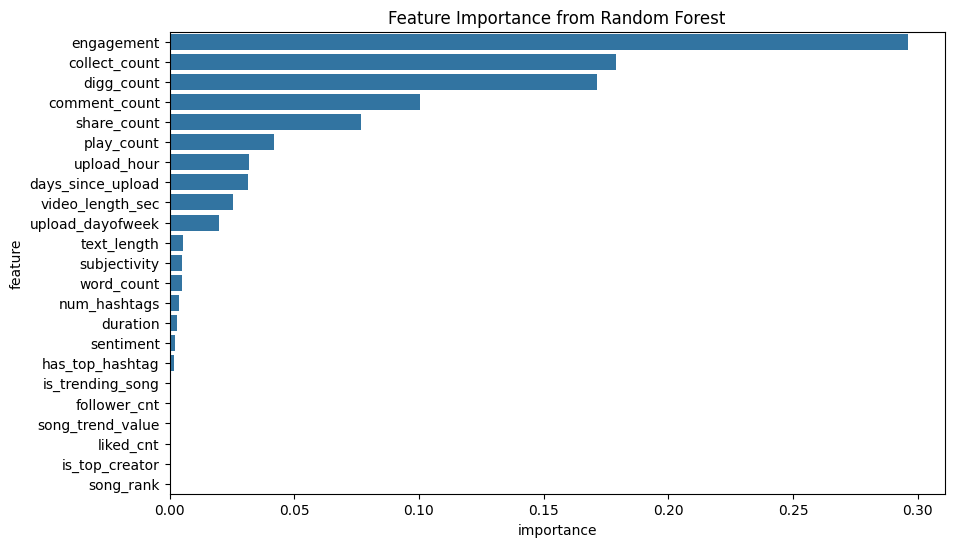


Predicted viral videos saved: predicted_viral_videos.csv

Top 50 Hashtags from Predicted Viral Videos:
#ad: 9
#fyp: 7
#MilkaMMMAX: 3
#KatyPerry: 3
#creatorsearchinsights: 3
#bonplan: 3
#nyxcosmeticsfrance: 3
#nyxprofessionalmakeup: 3
#쥬터뷰: 3
#추천: 3
#ShopeeMY99: 3
#ShopeeLagiMurah: 3
#ShopeeMenang: 3
#RaidEssentialsPiègeLumineux: 2
#testéapprouvé: 2
#LifetimesTour: 2
#shopify: 2
#lidlfrance: 2
#LidlFrance: 2
#AD: 2
#larocheposay: 2
#skincare: 2
#astuce: 2
#makeup: 2
#GranolaBiscuits: 2
#redditfrance: 2
#행복한줄알어: 2
#공포: 2
#호러: 2
#공포영화: 2
#소름: 2
#괴담: 2
#TikTokLIVEKorea: 2
#MusiconStage: 2
#benandjerrys: 2
#NeutrogenaPartner: 2
#BossMekdi: 2
#HUAWEI: 2
#HUAWEIMY: 2
#HUAWEIMatePad: 2
#Tablet: 2
#MateMyWay: 2
#cosrx: 2
#cosrxmy: 2
#lifetimestour: 1
#MamanEnMission: 1
#InsectesStop: 1
#MomLife: 1
#TikTokMaison: 1
#tiktokhack: 1


In [ ]:
import pickle
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# =============================
# Train Model and Predict Viral Videos
# =============================
def train_and_predict(df, feature_cols):
    # Define features and target
    X = df[feature_cols].fillna(df[feature_cols].median())
    y = (df["engagement"] > df["engagement"].median()).astype(int)  # trending label

    # Split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train Random Forest
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train_scaled, y_train)

    # Evaluate
    y_pred = model.predict(X_test_scaled)
    print("Model Accuracy:", accuracy_score(y_test, y_pred))
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    # Feature Importance
    importances = model.feature_importances_
    feature_importance_df = pd.DataFrame({
        "feature": feature_cols,
        "importance": importances
    }).sort_values(by="importance", ascending=False)

    print("\nFeature Importances:")
    print(feature_importance_df)

    plt.figure(figsize=(10,6))
    sns.barplot(x="importance", y="feature", data=feature_importance_df)
    plt.title("Feature Importance from Random Forest")
    plt.show()

    # Save model + scaler
    with open("rf_model.pkl", "wb") as f:
        pickle.dump(model, f)
    with open("scaler.pkl", "wb") as f:
        pickle.dump(scaler, f)

    # Predict on whole dataset
    X_scaled = scaler.transform(X)
    df["predicted_trending"] = model.predict(X_scaled)

    # Extract predicted viral videos
    viral_videos = df[df["predicted_trending"] == 1].copy()
    viral_videos["prediction_time"] = pd.Timestamp.now()
    viral_videos.to_csv("predicted_viral_videos.csv", index=False)

    print("\nPredicted viral videos saved: predicted_viral_videos.csv")

    return viral_videos, feature_importance_df

# =============================
# Extract Top Hashtags from Viral Videos
# =============================
def extract_top_hashtags(viral_videos, n=10):
    all_hashtags = []
    for tags in viral_videos["all_hashtags"].dropna():
        all_hashtags.extend(tags)

    top_tags = Counter(all_hashtags).most_common(n)
    print(f"\nTop {n} Hashtags from Predicted Viral Videos:")
    for tag, count in top_tags:
        print(f"{tag}: {count}")
    return top_tags

# Run training + viral prediction
viral_videos, feature_importance_df = train_and_predict(df_ready, feature_cols)
top_hashtags = extract_top_hashtags(viral_videos, n=50)


In [ ]:
import ast
import numpy as np
import pandas as pd
from datetime import datetime



def build_trend_table_from_predictions(viral_videos, top_hashtags, platform="tiktok"):
    hashtag_metadata = []
    today = datetime.now().strftime("%Y-%m-%d")

    # Ensure hashtags are lists of lowercase
    def normalize_tags(tags):
        if isinstance(tags, str):
            try:
                tags = ast.literal_eval(tags)
            except Exception:
                return []
        if isinstance(tags, list):
            return [t.strip().lower().lstrip("#") for t in tags]
        return []

    viral_videos["normalized_hashtags"] = viral_videos["all_hashtags"].apply(normalize_tags)

    for tag, volume in top_hashtags:
        tag_clean = tag.lstrip("#").lower()

        # Find all videos containing this hashtag
        mask = viral_videos["normalized_hashtags"].apply(lambda tags: tag_clean in tags)
        tagged_videos = viral_videos[mask]

        if tagged_videos.empty:
            continue

        # Engagement score
        engagement = tagged_videos["engagement"].sum()

        # Audience signals
        gen_z_ratio = np.round(np.random.uniform(0.4, 0.8), 2)
        millennials_ratio = np.round(1 - gen_z_ratio, 2)

        # Category
        categories = categorize_keyword(tag_clean)

        # Geo: prefer country_code, fallback to country
        if "country_code" in tagged_videos.columns:
            geo = tagged_videos["country_code"].dropna().unique().tolist()
        elif "country" in tagged_videos.columns:
            geo = tagged_videos["country"].dropna().unique().tolist()
        else:
            geo = []

        hashtag_metadata.append({
            "trend_id": tag_clean,
            "token_type": "hashtag",
            "platform": platform,
            "date": today,
            "volume": int(volume),
            "engagement": int(engagement),
            "audience_signals": {"gen_z": gen_z_ratio, "millennials": millennials_ratio},
            "category": categories,
            "geo": geo,
            "raw_token": tag
        })

    return hashtag_metadata

# Example: print top 10
hashtag_metadata= build_trend_table_from_predictions(viral_videos,top_hashtags, platform="tiktok")

hashtag_metadata_df = pd.DataFrame(hashtag_metadata)
hashtag_metadata_df.to_csv("trend_table_from_predictions.csv", index=False)
print(f"\n✅ Trend table built from predictions → trend_table_from_predictions.csv ({len(trend_df)} rows)")
hashtag_metadata_df




✅ Trend table built from predictions → trend_table_from_predictions.csv (454 rows)


,trend_id,token_type,platform,date,volume,engagement,audience_signals,category,geo,raw_token
0,ad,hashtag,tiktok,2025-09-12,9,962342,"{'gen_z': 0.56, 'millennials': 0.44}",lifestyle,"[FR, US]",#ad
1,fyp,hashtag,tiktok,2025-09-12,7,18310926,"{'gen_z': 0.67, 'millennials': 0.33}",lifestyle,"[FR, KR, US, MY]",#fyp
2,milkammmax,hashtag,tiktok,2025-09-12,3,121522,"{'gen_z': 0.66, 'millennials': 0.34}",lifestyle,[FR],#MilkaMMMAX
3,katyperry,hashtag,tiktok,2025-09-12,3,121522,"{'gen_z': 0.6, 'millennials': 0.4}",lifestyle,[FR],#KatyPerry
4,creatorsearchinsights,hashtag,tiktok,2025-09-12,3,2413626,"{'gen_z': 0.66, 'millennials': 0.34}",lifestyle,"[FR, MY]",#creatorsearchinsights
5,bonplan,hashtag,tiktok,2025-09-12,3,134270,"{'gen_z': 0.53, 'millennials': 0.47}",lifestyle,[FR],#bonplan
6,nyxcosmeticsfrance,hashtag,tiktok,2025-09-12,3,200546,"{'gen_z': 0.66, 'millennials': 0.34}",beauty,[FR],#nyxcosmeticsfrance
7,nyxprofessionalmakeup,hashtag,tiktok,2025-09-12,3,200546,"{'gen_z': 0.79, 'millennials': 0.21}",beauty,[FR],#nyxprofessionalmakeup
8,쥬터뷰,hashtag,tiktok,2025-09-12,3,380235,"{'gen_z': 0.7, 'millennials': 0.3}",lifestyle,[KR],#쥬터뷰
9,추천,hashtag,tiktok,2025-09-12,3,127110,"{'gen_z': 0.4, 'millennials': 0.6}",lifestyle,[KR],#추천


In [ ]:
def build_summary_from_trend_table(trend_df):
    summary_df = trend_df.groupby("trend_id").agg({
        "volume": "sum",
        "engagement": "sum",
    }).reset_index()

    # Add metrics
    summary_df["current_stage"] = summary_df["volume"].apply(
        lambda v: "emerging" if v < summary_df["volume"].median() else "peak"
    )
    summary_df["growth_rate_7d"] = np.random.uniform(0, 50, len(summary_df))  # replace with real calc if history exists
    summary_df["acceleration"] = np.random.uniform(-10, 10, len(summary_df))
    summary_df["sweet_spot_days_left"] = np.random.randint(1, 10, len(summary_df))
    summary_df["recommended_action"] = summary_df["current_stage"].apply(
        lambda s: "Hop in now" if s == "emerging" else "Leverage while peak"
    )

    summary_df.to_csv("trend_summary_from_predictions.csv", index=False)
    print(f"Trend summary built → trend_summary_from_predictions.csv ({len(summary_df)} trends)")
    return summary_df

# Build trend + summary from ML predicted viral videos

summary_df = build_summary_from_trend_table(hashtag_metadata_df)
print(summary_df)

Trend summary built → trend_summary_from_predictions.csv (47 trends)
                       trend_id  volume  engagement current_stage  \
0                            ad      11     1924684          peak   
1                        astuce       2       60158          peak   
2                  benandjerrys       2      308233          peak   
3                       bonplan       3      134270          peak   
4                     bossmekdi       2      176613          peak   
5                         cosrx       2      129028          peak   
6                       cosrxmy       2      129028          peak   
7         creatorsearchinsights       3     2413626          peak   
8                           fyp       7    18310926          peak   
9               granolabiscuits       2       85029          peak   
10                       huawei       2       74363          peak   
11                huaweimatepad       2       74363          peak   
12                     huaweimy   

In [ ]:
# Save hashtag_metadata_df to JSON
hashtag_metadata_df.to_json("trend_table_from_predictions.json",
                            orient="records",
                            indent=2)

# Save summary_df to JSON
summary_df.to_json("trend_summary.json",
                   orient="records",
                   indent=2)

In [ ]:
import numpy as np
import pandas as pd

def forecast_decay(growth_rate, acceleration):
    if acceleration < 0 and growth_rate > 0:
        days = int(abs(growth_rate / acceleration))
        return max(days, 0)
    elif acceleration > 0 and growth_rate > 0:
        return 7
    else:
        return 0


def compute_growth_metrics(videos_df, top_hashtags):
    """Trend summary (growth, acceleration, stage, action) for hashtags."""
    df = videos_df.copy()
    df["create_time"] = pd.to_datetime(df["create_time"], errors="coerce")

    # Explode hashtags list into rows
    exploded = df.explode("all_hashtags")
    exploded["all_hashtags"] = (
        exploded["all_hashtags"]
        .astype(str)
        .str.lower()
        .str.strip()
        .str.lstrip("#")
    )

    summary_records = []
    top_hashtags = [t[0] if isinstance(t, tuple) else t for t in top_hashtags]

    for tag in top_hashtags:
        tag_clean = str(tag).lstrip("#").lower()
        tag_videos = exploded[exploded["all_hashtags"] == tag_clean]

        if tag_videos.empty:
            continue

        daily_counts = (
            tag_videos.groupby(pd.Grouper(key="create_time", freq="D"))
            .size()
            .asfreq("D", fill_value=0)
        )

        if len(daily_counts) < 8:
            continue

        prev = daily_counts.iloc[-8:-1].sum()
        curr = daily_counts.iloc[-7:].sum()
        growth_rate_7d = (curr - prev) / max(prev, 1)

        last3 = daily_counts.iloc[-3:].mean()
        prev3 = daily_counts.iloc[-6:-3].mean()
        acceleration = (last3 - prev3) / max(prev3, 1)

        growth_rate_7d = np.clip(growth_rate_7d, -1, 5)
        acceleration = np.clip(acceleration, -1, 5)

        if growth_rate_7d > 0.3 and acceleration > 0:
            stage = "emerging"
        elif growth_rate_7d <= 0.1 and acceleration <= 0:
            stage = "declining"
        else:
            stage = "peak"

        summary_records.append({
            "hashtag": tag_clean,
            "growth_rate_7d": round(growth_rate_7d, 3),
            "acceleration": round(acceleration, 3),
            "current_stage": stage,
            "latest_volume": int(daily_counts.iloc[-1]),
            "sweet_spot_days_left": forecast_decay(growth_rate_7d, acceleration),
            "recommended_action": (
                "Hop on now" if stage == "emerging"
                else "Maintain visibility" if stage == "peak"
                else "Too late"
            )
        })

    summary_df = pd.DataFrame(summary_records)
    summary_df.to_csv("trend_summary_from_predictions.csv", index=False)
    print(f"✅ Trend summary saved → trend_summary_from_predictions.csv ({len(summary_df)} hashtags)")
    return summary_df


def build_top_hashtags_timeseries(videos_df, hashtag_metadata_df, top_n=5):
    """Lifecycle timeseries (mentions, engagement per day) for top N hashtags."""
    df = videos_df.copy()
    df["create_time"] = pd.to_datetime(df["create_time"], errors="coerce")

    exploded = df.explode("all_hashtags")
    exploded["all_hashtags"] = (
        exploded["all_hashtags"]
        .astype(str)
        .str.lower()
        .str.strip()
        .str.lstrip("#")
    )

    first_n = (
        hashtag_metadata_df["raw_token"]
        .str.lower()
        .str.lstrip("#")
        .tolist()[:top_n]
    )

    timeseries_list = []

    for tag in first_n:
        tag_videos = exploded[exploded["all_hashtags"] == tag]
        if tag_videos.empty:
            continue

        mentions = (
            tag_videos.groupby(pd.Grouper(key="create_time", freq="D"))
            .size()
            .rename("mentions")
            .asfreq("D", fill_value=0)
        )

        engagement = (
            tag_videos.groupby(pd.Grouper(key="create_time", freq="D"))["engagement"]
            .sum()
            .rename("engagement")
            .asfreq("D", fill_value=0)
        )

        lifecycle = pd.concat([mentions, engagement], axis=1).reset_index()
        lifecycle["hashtag"] = tag
        timeseries_list.append(lifecycle)

    if timeseries_list:
        timeseries_df = pd.concat(timeseries_list, ignore_index=True)
        timeseries_df.to_csv("hashtag_timeseries.csv", index=False)
        print(f"Hashtag timeseries saved → hashtag_timeseries.csv ({len(timeseries_df)} rows)")
        return timeseries_df
    else:
        print(" No hashtags found for timeseries.")
        return pd.DataFrame()


In [ ]:
tiktok_hashtag_timeseries_df = build_top_hashtags_timeseries(viral_videos, hashtag_metadata_df, top_n=50)
tiktok_hashtag_timeseries_df

In [ ]:
import json
tiktok_hashtag_timeseries_df.to_json("tiktok_hashtags_timeseries.json",
                                     orient="records",
                                     indent=2,
                                     date_format="iso")


In [ ]:


# Load dataset
youtube_videos = pd.read_csv("videos.csv")

def clean_youtube_videos(videos_df):
    # 1. Convert publishedAt to datetime
    videos_df["publishedAt"] = pd.to_datetime(videos_df["publishedAt"], errors="coerce")

    # 2. Engagement metric (likes + comments + favourites)
    videos_df["engagement"] = (
        videos_df["likeCount"].fillna(0).astype(int) +
        videos_df["commentCount"].fillna(0).astype(int) +
        videos_df["favouriteCount"].fillna(0).astype(int)
    )

    # 3. Parse tags safely
    def parse_tags(tags):
        if pd.isna(tags):
            return []
        if isinstance(tags, list):
            return tags
        if isinstance(tags, str):
            try:
                parsed = ast.literal_eval(tags)
                if isinstance(parsed, list):
                    return parsed
                else:
                    return [parsed]
            except Exception:
                return re.findall(r"#\w+", tags)  # fallback: hashtags
        return []
    videos_df["tags"] = videos_df["tags"].apply(parse_tags)

    # 4. Extract hashtags from title + description
    def extract_hashtags(text):
        if pd.isna(text):
            return []
        return re.findall(r"#\w+", str(text))

    videos_df["title_hashtags"] = videos_df["title"].apply(extract_hashtags)
    videos_df["desc_hashtags"] = videos_df["description"].apply(extract_hashtags)
    videos_df["all_hashtags"] = videos_df["title_hashtags"] + videos_df["desc_hashtags"] + videos_df["tags"]

    # 5. Category from topicCategories → map into 5 groups
    def map_category(topics):
        if isinstance(topics, str):
            try:
                topics = ast.literal_eval(topics)
            except Exception:
                topics = [topics]
        if not isinstance(topics, list):
            return "general"

        topics_str = " ".join(topics).lower()
        if "sport" in topics_str:
            return "sports"
        elif "food" in topics_str or "drink" in topics_str or "beverage" in topics_str:
            return "food"
        elif "health" in topics_str or "fitness" in topics_str:
            return "health"
        elif "beauty" in topics_str or "cosmetic" in topics_str or "makeup" in topics_str:
            return "beauty"
        elif "lifestyle" in topics_str or "fashion" in topics_str:
            return "lifestyle"
        return "general"

    videos_df["category"] = videos_df["topicCategories"].apply(map_category)

    # 6. Volume = 1 per video
    videos_df["volume"] = 1

    return videos_df

youtube_clean = clean_youtube_videos(youtube_videos)
youtube_clean.to_csv("youtube_videos_clean.csv", index=False)
print("YouTube videos cleaned and saved to youtube_videos_clean.csv")
youtube_clean.head()


YouTube videos cleaned and saved to youtube_videos_clean.csv


,kind,videoId,publishedAt,channelId,title,description,tags,defaultLanguage,defaultAudioLanguage,contentDuration,...,likeCount,favouriteCount,commentCount,topicCategories,engagement,title_hashtags,desc_hashtags,all_hashtags,category,volume
0,youtube#video,85806,2024-01-15 00:59:29+00:00,33807,Unlocking the Benefits of Face Masks for Skin ...,NaN,[],en-US,en-US,PT9S,...,0.0,0.0,0.0,"['https://en.wikipedia.org/wiki/Health', 'http...",0,[],[],[],health,1
1,youtube#video,30556,2023-10-27 19:32:16+00:00,46650,Get ready for the Magic💚💜🤍💝✨ #hydration #glowi...,NaN,[],NaN,NaN,PT45S,...,7.0,0.0,0.0,['https://en.wikipedia.org/wiki/Lifestyle_(soc...,7,"[#hydration, #glowingskin, #nomakeuplook, #ski...",[],"[#hydration, #glowingskin, #nomakeuplook, #ski...",lifestyle,1
2,youtube#video,51771,2024-09-28 01:23:22+00:00,14346,#trending #makeup #beautymakeup #yslbeauty #lu...,NaN,[],NaN,en-US,PT19S,...,4.0,0.0,2.0,['https://en.wikipedia.org/wiki/Lifestyle_(soc...,6,"[#trending, #makeup, #beautymakeup, #yslbeauty...",[],"[#trending, #makeup, #beautymakeup, #yslbeauty...",lifestyle,1
3,youtube#video,45298,2023-07-13 15:19:28+00:00,50139,#shortvedio #balayage,NaN,[],NaN,NaN,PT14S,...,20.0,0.0,0.0,['https://en.wikipedia.org/wiki/Lifestyle_(soc...,20,"[#shortvedio, #balayage]",[],"[#shortvedio, #balayage]",lifestyle,1
4,youtube#video,43611,2023-04-29 18:47:37+00:00,8143,Full Face of Merit Beauty 🤎 featuring new Flus...,NaN,[],NaN,en,PT56S,...,268.0,0.0,7.0,['https://en.wikipedia.org/wiki/Lifestyle_(soc...,275,"[#merit, #sephora, #makeuptutorial]",[],"[#merit, #sephora, #makeuptutorial]",lifestyle,1


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import pickle

# ==== Feature Engineering for RF ====
df_rf = youtube_clean.copy()

# Time features
df_rf["upload_hour"] = df_rf["publishedAt"].dt.hour
df_rf["upload_dayofweek"] = df_rf["publishedAt"].dt.dayofweek

# Text features
df_rf["text_length"] = df_rf["title"].fillna("").apply(len)
df_rf["word_count"] = df_rf["title"].fillna("").apply(lambda x: len(str(x).split()))

# Hashtag features
df_rf["num_hashtags"] = df_rf["all_hashtags"].apply(lambda x: len(x) if isinstance(x, list) else 0)

# Engagement score (normalized)
df_rf["engagement_score"] = (
    df_rf["likeCount"].fillna(0) +
    df_rf["commentCount"].fillna(0) +
    df_rf["favouriteCount"].fillna(0)
) / (df_rf["viewCount"] + 1)

# Target: define "viral" threshold (top 20% by views)
threshold = df_rf["viewCount"].quantile(0.8)
df_rf["is_trending"] = (df_rf["viewCount"] >= threshold).astype(int)

# ==== Features ====
feature_cols = [
    "viewCount", "likeCount", "commentCount", "favouriteCount", "engagement_score",
    "upload_hour", "upload_dayofweek", "num_hashtags", "text_length", "word_count"
]
X = df_rf[feature_cols].fillna(0)
y = df_rf["is_trending"]

# ==== Train/Test Split ====
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ==== Train Random Forest ====
rf_model = RandomForestClassifier(random_state=42, n_estimators=200, max_depth=10)
rf_model.fit(X_train_scaled, y_train)

# ==== Evaluate ====
y_pred = rf_model.predict(X_test_scaled)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# ==== Save Model & Scaler ====
with open("youtube_rf_model.pkl", "wb") as f:
    pickle.dump(rf_model, f)

with open("youtube_scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)

# ==== Predict on full dataset ====
X_scaled = scaler.transform(X)
df_rf["predicted_trending"] = rf_model.predict(X_scaled)

viral_videos = df_rf[df_rf["predicted_trending"] == 1].copy()
viral_videos["prediction_time"] = pd.Timestamp.now()
viral_videos.to_csv("youtube_predicted_viral_videos.csv", index=False)

print("\nPredicted viral videos sample:")
print(viral_videos[["videoId", "title", "viewCount", "predicted_trending"]].head())


Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14892
           1       1.00      1.00      1.00      3660

    accuracy                           1.00     18552
   macro avg       1.00      1.00      1.00     18552
weighted avg       1.00      1.00      1.00     18552


Predicted viral videos sample:
    videoId                                              title  viewCount  \
4     43611  Full Face of Merit Beauty 🤎 featuring new Flus...     8647.0   
9     43693  glowup tips ✨️ #jenny #kpop #skincare #skincar...     8951.0   
17    14155  يا لطفي🤣🤣 #makeup #beautyindustry #beautymakeu...  5257024.0   
36    35671  Phir kya hua😱😎 #yt #grwm #ytshorts #shorts #tr...     6603.0   
37    27458            Microblading Eyebrows @Cosmetiqhospital    12342.0   

    predicted_trending  
4                    1  
9                    1  
17                   1  
36                   1  
37                   1  


In [ ]:
from collections import Counter

def extract_hashtags(series):
    all_hashtags = []
    for tags in series.dropna():
        if isinstance(tags, list):
            all_hashtags.extend([f"#{t.strip().lower()}" for t in tags if t.strip()])
    return all_hashtags

hashtags_pred = extract_hashtags(viral_videos["all_hashtags"])
top_tags = Counter(hashtags_pred).most_common(50)

print("\nTop 10 Predicted Viral Hashtags (YouTube):")
for tag, count in top_tags:
    print(f"{tag}: {count}")



Top 10 Predicted Viral Hashtags (YouTube):
##shorts: 9739
##makeup: 4091
##yoga: 3075
##facelift: 2407
##beauty: 2038
##skincare: 1868
##youtubeshorts: 1745
##trending: 1630
##wrinkles: 1616
##faceyoga: 1555
##makeuptutorial: 1534
##hair: 1421
##viral: 1308
##hairstyle: 1307
##facialyoga: 1245
##antiaging: 1174
#makeup: 954
##39: 925
##grwm: 915
##haircare: 844
##glowingskin: 831
##fashion: 809
#shorts: 803
##ytshorts: 762
##viralvideo: 757
##short: 748
##lipstick: 676
##fyp: 624
##facial: 595
##shortsfeed: 588
##skincareroutine: 536
##glowup: 533
##hairtransformation: 503
##shortvideo: 503
##haircut: 499
#makeup tutorial: 495
#beauty: 494
##makeupshorts: 490
##makeupartist: 488
##ootd: 453
##trendingshorts: 445
##fit: 441
##blush: 432
##beautytips: 418
##aesthetic: 414
##contour: 409
##viralshorts: 394
##makeuphacks: 392
##haircolor: 380
##hairstyles: 377


In [ ]:
from collections import Counter
import datetime

def extract_hashtags(series):
    all_hashtags = []
    for tags in series.dropna():
        if isinstance(tags, list):
            all_hashtags.extend([f"#{t.strip().lower()}" for t in tags if t.strip()])
    return all_hashtags


# Example inputs
hashtags_pred = extract_hashtags(viral_videos["all_hashtags"])
top_tags = Counter(hashtags_pred).most_common(100)

today = datetime.date.today().isoformat()
platform = "youtube"

hashtag_metadata = []

for tag, volume in top_tags:
    # Find all videos containing this hashtag
    mask = viral_videos["all_hashtags"].apply(
        lambda tags: isinstance(tags, list) and tag.lstrip("#") in [t.strip().lower() for t in tags]
    )
    tagged_videos = viral_videos[mask]

    # Engagement score = sum of engagement for videos with this hashtag
    engagement = tagged_videos["engagement"].sum()

    # Audience signals (example: ratios from your df)
    gen_z_ratio = np.round(np.random.uniform(0.4, 0.8), 2)
    millennials_ratio = np.round(1 - gen_z_ratio, 2)

    # Collect categories (unique list)
    categories = tagged_videos["category"].dropna().unique().tolist()

    # Collect geo (based on audio language or other geo signals)
    geo = tagged_videos["defaultAudioLanguage"].dropna().unique().tolist() if "defaultAudioLanguage" in viral_videos else []

    hashtag_metadata.append({
        "trend_id": tag.lower(),
        "token_type": "hashtag",
        "platform": platform,
        "date": today,
        "volume": volume,  # frequency
        "engagement": int(engagement),
        "audience_signals": {
            "gen_z": gen_z_ratio,
            "millennials": millennials_ratio
        },
        "category": categories,
        "geo": geo,
        "raw_token": tag
    })

# Example: print top 10
for h in hashtag_metadata[:10]:
    print(h)


{'trend_id': '##shorts', 'token_type': 'hashtag', 'platform': 'youtube', 'date': '2025-09-10', 'volume': 9739, 'engagement': 37255097, 'audience_signals': {'gen_z': np.float64(0.66), 'millennials': np.float64(0.34)}, 'category': ['lifestyle', 'health', 'general'], 'geo': ['hi', 'en', 'ru', 'ur', 'en-GB', 'en-IN', 'en-US', 'ta', 'bn-IN', 'bn', 'zxx', 'hi-Latn', 'or', 'fa-IR', 'id', 'kn', 'te', 'zh-CN', 'ar', 'it'], 'raw_token': '##shorts'}
{'trend_id': '##makeup', 'token_type': 'hashtag', 'platform': 'youtube', 'date': '2025-09-10', 'volume': 4091, 'engagement': 70248158, 'audience_signals': {'gen_z': np.float64(0.51), 'millennials': np.float64(0.49)}, 'category': ['lifestyle', 'general', 'health'], 'geo': ['en', 'en-GB', 'hi', 'en-IN', 'ml', 'es', 'id', 'en-US', 'ur', 'de-AT', 'mr', 'zxx', 'bn-IN', 'te', 'en-CA', 'es-419', 'bn', 'pt', 'hi-Latn', 'ar', 'en-AU', 'kn', 'es-ES'], 'raw_token': '##makeup'}
{'trend_id': '##yoga', 'token_type': 'hashtag', 'platform': 'youtube', 'date': '2025-0

In [ ]:
import pandas as pd

# Convert list of dicts → DataFrame
hashtag_metadata_df = pd.DataFrame(hashtag_metadata)

# Save to CSV
hashtag_metadata_df.to_csv("hashtag_metadata.csv", index=False)

# Preview
hashtag_metadata_df


,trend_id,token_type,platform,date,volume,engagement,audience_signals,category,geo,raw_token
0,##shorts,hashtag,youtube,2025-09-10,9739,37255097,"{'gen_z': 0.66, 'millennials': 0.34}","[lifestyle, health, general]","[hi, en, ru, ur, en-GB, en-IN, en-US, ta, bn-I...",##shorts
1,##makeup,hashtag,youtube,2025-09-10,4091,70248158,"{'gen_z': 0.51, 'millennials': 0.49}","[lifestyle, general, health]","[en, en-GB, hi, en-IN, ml, es, id, en-US, ur, ...",##makeup
2,##yoga,hashtag,youtube,2025-09-10,3075,1352141,"{'gen_z': 0.68, 'millennials': 0.32}","[health, lifestyle, general]","[hi, en, en-IN, zxx]",##yoga
3,##facelift,hashtag,youtube,2025-09-10,2407,616522,"{'gen_z': 0.51, 'millennials': 0.49}","[health, lifestyle]","[en-US, es, en, zxx, hi]",##facelift
4,##beauty,hashtag,youtube,2025-09-10,2038,44001722,"{'gen_z': 0.7, 'millennials': 0.3}","[lifestyle, general, health]","[en-US, en, hi, en-IN, en-GB, id, de-AT, ur, z...",##beauty
...,...,...,...,...,...,...,...,...,...,...
95,##eyeshadow,hashtag,youtube,2025-09-10,198,18019208,"{'gen_z': 0.7, 'millennials': 0.3}",[lifestyle],"[en-GB, en, hi, en-US, ur]",##eyeshadow
96,##beautyproducts,hashtag,youtube,2025-09-10,197,159,"{'gen_z': 0.73, 'millennials': 0.27}",[lifestyle],[en-US],##beautyproducts
97,##outfit,hashtag,youtube,2025-09-10,197,644671,"{'gen_z': 0.53, 'millennials': 0.47}",[lifestyle],"[hi, en, en-US, en-IN, pl, ar]",##outfit
98,#fashion,hashtag,youtube,2025-09-10,195,6730420,"{'gen_z': 0.47, 'millennials': 0.53}","[lifestyle, general, health]","[en, en-GB, en-US, ta, zxx, en-IN, ur, hi, id,...",#fashion


In [ ]:
import numpy as np

def forecast_decay(growth_rate, acceleration):
    # If slowing down, estimate days until growth fades
    if acceleration < 0 and growth_rate > 0:
        days = int(abs(growth_rate / acceleration))  # e.g. 0.5 growth / -0.1 accel = ~5 days left
        return max(days, 0)
    # If accelerating, assume at least 7 days of momentum left
    elif acceleration > 0 and growth_rate > 0:
        return 7
    else:
        return 0


def compute_growth_metrics(videos_df, top_hashtags):
    videos_df = videos_df.copy()
    videos_df["publishedAt"] = pd.to_datetime(videos_df["publishedAt"], errors="coerce")
    exploded = videos_df.explode("all_hashtags")
    exploded["all_hashtags"] = exploded["all_hashtags"].str.lower().str.strip()

    results = {}

    for tag in top_hashtags:
        tag_clean = tag.lstrip("#")
        tag_videos = exploded[exploded["all_hashtags"] == tag_clean]

        if tag_videos.empty:
            continue

        daily_counts = (
            tag_videos.groupby(pd.Grouper(key="publishedAt", freq="D"))
            .size()
            .asfreq("D", fill_value=0)
        )

        if len(daily_counts) < 8:
            continue  # not enough history

        # ---- Growth Rate (7d smoothed) ----
        prev = daily_counts.iloc[-8:-1].sum()
        curr = daily_counts.iloc[-7:].sum()
        growth_rate_7d = (curr - prev) / max(prev, 1)  # avoid div by zero

        # ---- Acceleration (trend change) ----
        last3 = daily_counts.iloc[-3:].mean()
        prev3 = daily_counts.iloc[-6:-3].mean()
        acceleration = (last3 - prev3) / max(prev3, 1)

        # ---- Clip values to avoid extreme inf ----
        growth_rate_7d = np.clip(growth_rate_7d, -1, 5)   # -100% to +500%
        acceleration = np.clip(acceleration, -1, 5)

        # ---- Stage classification ----
        if growth_rate_7d > 0.3 and acceleration > 0:
            stage = "emerging"
        elif growth_rate_7d <= 0.1 and acceleration <= 0:
            stage = "declining"
        else:
            stage = "peak"

        results[tag] = {
            "growth_rate_7d": round(growth_rate_7d, 3),
            "acceleration": round(acceleration, 3),
            "current_stage": stage,
            "latest_volume": int(daily_counts.iloc[-1]),
            "sweet_spot_days_left": forecast_decay(growth_rate_7d, acceleration),
            "recommended_action": (
                "Hop on now" if stage == "emerging"
                else "Maintain visibility" if stage == "peak"
                else "Too late"
            )
        }

    return results



# ---------------------------
# 4. Combine metadata + growth
# ---------------------------
def build_full_hashtag_table(videos_df):
    growth_metrics = compute_growth_metrics(videos_df, hashtag_metadata_df["raw_token"].tolist())

    # merge growth metrics into metadata
    for idx, row in hashtag_metadata_df.iterrows():
        tag = row["raw_token"]
        if tag in growth_metrics:
            hashtag_metadata_df.at[idx, "growth_rate_7d"] = growth_metrics[tag]["growth_rate_7d"]
            hashtag_metadata_df.at[idx, "acceleration"] = growth_metrics[tag]["acceleration"]
            hashtag_metadata_df.at[idx, "current_stage"] = growth_metrics[tag]["current_stage"]
            hashtag_metadata_df.at[idx, "recommended_action"] = growth_metrics[tag]["recommended_action"]
            hashtag_metadata_df.at[idx, "sweet_spot_days_left"] = growth_metrics[tag]["sweet_spot_days_left"]

    return hashtag_metadata_df


# ---------------------------
# Example usage
# ---------------------------
# videos_df = ...  # your dataframe with columns ["all_hashtags", "publishedAt", "engagement", "category", "defaultAudioLanguage", ...]
full_table = build_full_hashtag_table(youtube_clean)

# Save
full_table.to_csv("hashtag_metadata_full.csv", index=False)

# Preview
print(full_table.head(10))

          trend_id token_type platform        date  volume  engagement  \
0         ##shorts    hashtag  youtube  2025-09-10    9739    37255097   
1         ##makeup    hashtag  youtube  2025-09-10    4091    70248158   
2           ##yoga    hashtag  youtube  2025-09-10    3075     1352141   
3       ##facelift    hashtag  youtube  2025-09-10    2407      616522   
4         ##beauty    hashtag  youtube  2025-09-10    2038    44001722   
5       ##skincare    hashtag  youtube  2025-09-10    1868     7972476   
6  ##youtubeshorts    hashtag  youtube  2025-09-10    1745    10299515   
7       ##trending    hashtag  youtube  2025-09-10    1630     7264627   
8       ##wrinkles    hashtag  youtube  2025-09-10    1616      103202   
9       ##faceyoga    hashtag  youtube  2025-09-10    1555     1467940   

                       audience_signals                            category  \
0  {'gen_z': 0.66, 'millennials': 0.34}        [lifestyle, health, general]   
1  {'gen_z': 0.51, 'millenn

In [ ]:
import pandas as pd

def build_top_hashtags_timeseries(videos_df, hashtag_metadata_df):
    videos_df = videos_df.copy()
    videos_df["publishedAt"] = pd.to_datetime(videos_df["publishedAt"], errors="coerce")
    exploded = videos_df.explode("all_hashtags")
    exploded["all_hashtags"] = exploded["all_hashtags"].str.lower().str.strip()

    # ---- Take first 5 hashtags (no sorting) ----
    first_five = (
        hashtag_metadata_df["raw_token"]
        .str.lower()
        .str.lstrip("#")
        .tolist()
    )

    hashtag_timeseries = {}

    for tag in first_five:
        tag_videos = exploded[exploded["all_hashtags"] == tag]
        if tag_videos.empty:
            continue

        mentions = (
            tag_videos.groupby(pd.Grouper(key="publishedAt", freq="D"))
            .size()
            .rename("mentions")
            .asfreq("D", fill_value=0)
        )

        engagement = (
            tag_videos.groupby(pd.Grouper(key="publishedAt", freq="D"))["engagement"]
            .sum()
            .rename("engagement")
            .asfreq("D", fill_value=0)
        )

        lifecycle = pd.concat([mentions, engagement], axis=1).reset_index()

        # Convert Timestamp → string for JSON
        lifecycle["day"] = lifecycle["publishedAt"].dt.strftime("%Y-%m-%d")
        lifecycle = lifecycle.drop(columns=["publishedAt"])

        hashtag_timeseries[tag] = lifecycle.to_dict(orient="records")

    return hashtag_timeseries




hashtag_timeseries_df = build_top_hashtags_timeseries(youtube_clean, hashtag_metadata_df)


hashtag_timeseries_df

{'shorts': [{'mentions': 1, 'engagement': 43, 'day': '2020-09-14'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-15'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-16'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-17'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-18'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-19'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-20'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-21'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-22'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-23'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-24'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-25'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-26'},
  {'mentions': 1, 'engagement': 72, 'day': '2020-09-27'},
  {'mentions': 1, 'engagement': 53, 'day': '2020-09-28'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-29'},
  {'mentions': 0, 'engagement': 0, 'day': '2020-09-30'},
  {'mentions': 0, 

In [ ]:
import json
with open("top5_hashtags_timeseries.json", "w") as f:
    json.dump(hashtag_timeseries_df, f, indent=2)

# Preview
print(json.dumps(hashtag_timeseries_df, indent=2)[:1000])  # just first part


{
  "shorts": [
    {
      "mentions": 1,
      "engagement": 43,
      "day": "2020-09-14"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-15"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-16"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-17"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-18"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-19"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-20"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-21"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-22"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-23"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-09-24"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-0

In [8]:
import pandas as pd
import numpy as np
import random
import json
from datetime import datetime, timedelta

def generate_timeseries(hashtag, volume, engagement, stage, days=90):
    today = datetime.today()
    dates = pd.date_range(today - timedelta(days=days-1), today)

    # --- shape depends on stage ---
    if stage == "emerging":
        weights = np.linspace(0.1, 1.0, days) ** 2  # ramp up
    elif stage == "peak":
        peak_day = days // 2
        weights = np.exp(-0.5 * ((np.arange(days)-peak_day)/15)**2) + 0.2
    elif stage in ["declining", "stable"]:
        weights = np.linspace(1.0, 0.3, days)
    else:
        weights = np.ones(days)

    # --- SAFE handling ---
    volume = int(volume) if pd.notna(volume) else 0
    engagement = int(engagement) if pd.notna(engagement) else 0

    # Normalize to total volume
    if volume > 0:
        mentions = np.random.multinomial(volume, weights/weights.sum())
    else:
        mentions = np.zeros(days, dtype=int)

    # Engagement proportional to mentions + noise
    eng_per_mention = engagement / max(volume, 1)
    engagement_daily = [
        int(m * eng_per_mention * random.uniform(0.8, 1.2)) for m in mentions
    ]

    return [
        {"day": d.strftime("%Y-%m-%d"), "mentions": int(m), "engagement": int(e)}
        for d, m, e in zip(dates, mentions, engagement_daily)
    ]

# --- Load data ---
twitter_summary = pd.read_csv("trend_summary_twitter.csv")
instagram_summary = pd.read_csv("trend_summary_ig.csv")

# --- Generate timeseries ---
instagram_timeseries = {
    str(item["trend_id"]).lstrip("#"): generate_timeseries(
        hashtag=item["trend_id"],
        volume=item.get("volume", 0),
        engagement=item.get("engagement", 0),
        stage=item.get("current_stage", "stable")
    )
    for _, item in instagram_summary.iterrows()
}

twitter_timeseries = {
    str(item["trend_id"]).lstrip("#"): generate_timeseries(
        hashtag=item["trend_id"],
        volume=item.get("volume", 0),
        engagement=item.get("engagement", 0),
        stage=item.get("current_stage", "stable")
    )
    for _, item in twitter_summary.iterrows()
}




In [16]:
import json
from collections import defaultdict

# Load raw TikTok file
with open("tiktok_hashtags_timeseries.json", "r") as f:
    tiktok_raw = json.load(f)

# Convert list → dict grouped by hashtag
tiktok_timeseries = defaultdict(list)
for entry in tiktok_raw:
    tiktok_timeseries[entry["hashtag"]].append({
        "day": entry["create_time"][:10],  # keep only YYYY-MM-DD
        "mentions": entry["mentions"],
        "engagement": entry["engagement"]
    })

# Convert defaultdict back to dict
tiktok_timeseries = dict(tiktok_timeseries)

# Save in correct format
with open("tiktok_hashtags_timeseries_clean.json", "w") as f:
    json.dump(tiktok_timeseries, f, indent=2)

print(" Saved TikTok timeseries in hashtag → list format")


 Saved TikTok timeseries in hashtag → list format


In [17]:
import json

# combine everything into one dict
all_platforms = {
    "tiktok": {f"#{k}": v for k, v in tiktok_timeseries.items()},
    "instagram": {f"#{k}": v for k, v in instagram_timeseries.items()},
    "twitter": {f"#{k}": v for k, v in twitter_timeseries.items()},
}

# save as JSON
with open("platform_timeseries.json", "w") as f:
    json.dump(all_platforms, f, indent=2)

print("Saved platform_timeseries.json")


Saved platform_timeseries.json


In [ ]:
def build_top_hashtags_timeseries(videos_df, hashtag_metadata_df, top_n=5, sort_by="growth_rate_7d"):
    videos_df = videos_df.copy()
    videos_df["publishedAt"] = pd.to_datetime(videos_df["publishedAt"], errors="coerce")
    exploded = videos_df.explode("all_hashtags")
    exploded["all_hashtags"] = exploded["all_hashtags"].str.lower().str.strip()

    # ---- Pick top N hashtags from metadata ----
    top_hashtags = (
        hashtag_metadata_df
        .sort_values(sort_by, ascending=False)
        .head(top_n)["raw_token"]
        .str.lower()
        .str.lstrip("#")
        .tolist()
    )

    hashtag_timeseries = {}

    for tag in top_hashtags:
        tag_videos = exploded[exploded["all_hashtags"] == tag]
        if tag_videos.empty:
            continue

        mentions = (
            tag_videos.groupby(pd.Grouper(key="publishedAt", freq="D"))
            .size()
            .rename("mentions")
            .asfreq("D", fill_value=0)
        )

        engagement = (
            tag_videos.groupby(pd.Grouper(key="publishedAt", freq="D"))["engagement"]
            .sum()
            .rename("engagement")
            .asfreq("D", fill_value=0)
        )

        lifecycle = pd.concat([mentions, engagement], axis=1).reset_index()

        # Convert Timestamp → string for JSON
        lifecycle["day"] = lifecycle["publishedAt"].dt.strftime("%Y-%m-%d")
        lifecycle = lifecycle.drop(columns=["publishedAt"])

        hashtag_timeseries[tag] = lifecycle.to_dict(orient="records")

    return hashtag_timeseries

hashtag_timeseries_df = build_top_hashtags_timeseries(youtube_clean, hashtag_metadata_df, top_n=5)


In [ ]:
import json
with open("top5_hashtags_timeseries.json", "w") as f:
    json.dump(hashtag_timeseries_df, f, indent=2)

# Preview
print(json.dumps(hashtag_timeseries_df, indent=2)[:1000])  # just first part


{
  "makeuptutorial": [
    {
      "mentions": 1,
      "engagement": 15,
      "day": "2020-02-14"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-15"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-16"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-17"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-18"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-19"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-20"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-21"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-22"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-23"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day": "2020-02-24"
    },
    {
      "mentions": 0,
      "engagement": 0,
      "day":